In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
from sklearn.preprocessing  import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
import os
import plotly.graph_objs as go
import joblib
import itertools
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.model_selection import train_test_split,RandomizedSearchCV, GridSearchCV,StratifiedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier


In [3]:
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
#from sklearn.metrics import confusion matrix, accuracy_score, recall_score, precision_score
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    classification_report,
    f1_score
)
from sklearn.model_selection import learning_curve
from mlxtend.plotting import plot_decision_regions
from sklearn.decomposition import PCA


In [46]:
# Reads dataset
curr_path = os.getcwd()
df = pd.read_csv(curr_path+"/DATA3.csv",sep=';')
#df =pd.read_csv('C://Users//Arash//Desktop//T1//DATA3.csv',sep=';')
#Checks shape 
print(df.shape)

(145, 33)


In [47]:
#Reads column
print("Data Column --> ",list(df.columns))

Data Column -->  ['student_id', 'age', 'sex', 'graduated_h_school_type', 'scholarship_type', 'additional_work', 'activity', 'partner', 'total_salary', 'transport', 'accomodation', 'mother_ed', 'farther_ed', 'siblings', 'parental_status', 'mother_occup', 'father_occup', 'weekly_study_hours', 'reading_non_scientific', 'reading_scientific', 'attendance_seminars_dep', 'impact_of_projects', 'attendances_classes', 'preparation_midterm_company', 'preparation_midterm_time', 'taking_notes', 'listenning', 'discussion_improves_interest', 'flip_classrom', 'grade_previous', 'grade_expected', 'course_id', 'grade']


In [48]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145 entries, 0 to 144
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   student_id                    145 non-null    object
 1   age                           145 non-null    int64 
 2   sex                           145 non-null    int64 
 3   graduated_h_school_type       145 non-null    int64 
 4   scholarship_type              145 non-null    int64 
 5   additional_work               145 non-null    int64 
 6   activity                      145 non-null    int64 
 7   partner                       145 non-null    int64 
 8   total_salary                  145 non-null    int64 
 9   transport                     145 non-null    int64 
 10  accomodation                  145 non-null    int64 
 11  mother_ed                     145 non-null    int64 
 12  farther_ed                    145 non-null    int64 
 13  siblings            

In [4]:
df.head()

,student_id,age,sex,graduated_h_school_type,scholarship_type,additional_work,activity,partner,total_salary,transport,...,preparation_midterm_company,preparation_midterm_time,taking_notes,listenning,discussion_improves_interest,flip_classrom,grade_previous,grade_expected,course_id,grade
0,STUDENT1,2,2,3,3,1,2,2,1,1,...,1,1,3,2,1,2,1,1,1,1
1,STUDENT2,2,2,3,3,1,2,2,1,1,...,1,1,3,2,3,2,2,3,1,1
2,STUDENT3,2,2,2,3,2,2,2,2,4,...,1,1,2,2,1,1,2,2,1,1
3,STUDENT4,1,1,1,3,1,2,1,2,1,...,1,2,3,2,2,1,3,2,1,1
4,STUDENT5,2,2,1,3,2,2,1,3,1,...,2,1,2,2,2,1,2,2,1,1


In [8]:
#Prints head of dataset
print(df.iloc[:,0:9].head().to_string())
print(df.iloc[:,9:16].head().to_string())
print(df.iloc[:,16:24].head().to_string())
print(df.iloc[:,24:33].head().to_string()) 

  student_id  age  sex  graduated_h_school_type  scholarship_type  additional_work  activity  partner  total_salary
0   STUDENT1    2    2                        3                 3                1         2        2             1
1   STUDENT2    2    2                        3                 3                1         2        2             1
2   STUDENT3    2    2                        2                 3                2         2        2             2
3   STUDENT4    1    1                        1                 3                1         2        1             2
4   STUDENT5    2    2                        1                 3                2         2        1             3
   transport  accomodation  mother_ed  farther_ed  siblings  parental_status  mother_occup
0          1             1          1           2         3                1             2
1          1             1          2           3         2                1             2
2          4             2     

student_id                      0
age                             0
sex                             0
graduated_h_school_type         0
scholarship_type                0
additional_work                 0
activity                        0
partner                         0
total_salary                    0
transport                       0
accomodation                    0
mother_ed                       0
farther_ed                      0
siblings                        0
parental_status                 0
mother_occup                    0
father_occup                    0
weekly_study_hours              0
reading_non_scientific          0
reading_scientific              0
attendance_seminars_dep         0
impact_of_projects              0
attendances_classes             0
preparation_midterm_company     0
preparation_midterm_time        0
taking_notes                    0
listenning                      0
discussion_improves_interest    0
flip_classrom                   0
grade_previous

Text(0.5, 1.0, 'Missing Values Count')

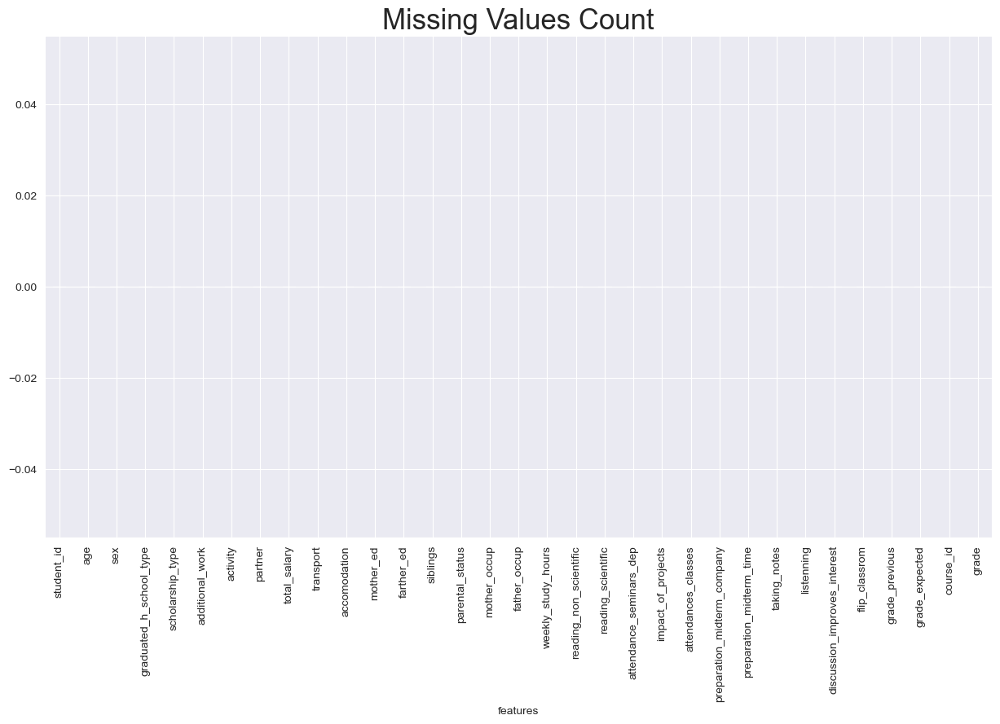

In [9]:
#Checks null values
print(df.isnull().sum())
print('Total number of null values: ', df.isnull().sum().sum()) 
#Plots null values 
missing = df.isna().sum().reset_index()
missing.columns = ['features', 'total_missing'] 
missing['percent'] = (missing['total_missing'] / len(df)) * 100
missing.index = missing['features']
del missing['features'] 
plt.figure(figsize=(15,8))
missing['total_missing'].plot(kind = 'bar') 
plt.title('Missing Values Count', fontsize = 25) 

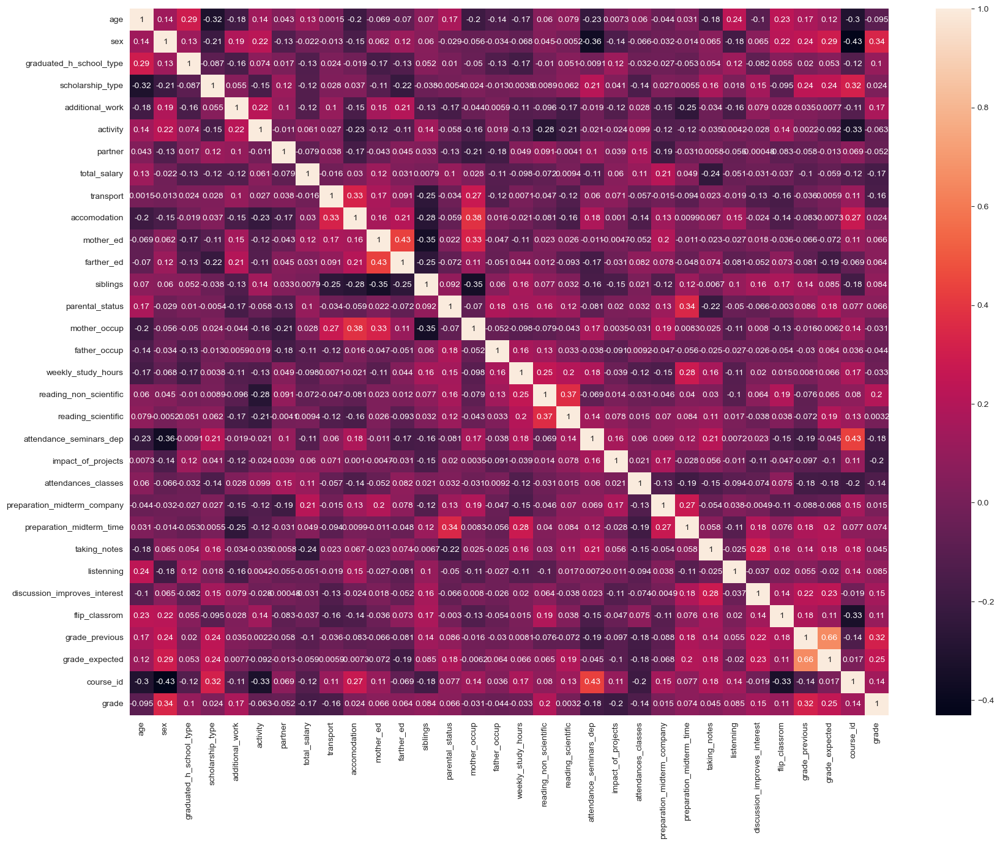

In [49]:
#Plots correlation matrix
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),annot=True)
plt.show() 

In [50]:
print(df.describe().T.to_string())

                              count      mean       std  min  25%  50%  75%  max
age                           145.0  1.620690  0.613154  1.0  1.0  2.0  2.0  3.0
sex                           145.0  1.600000  0.491596  1.0  1.0  2.0  2.0  2.0
graduated_h_school_type       145.0  1.944828  0.537216  1.0  2.0  2.0  2.0  3.0
scholarship_type              145.0  3.572414  0.805750  1.0  3.0  3.0  4.0  5.0
additional_work               145.0  1.662069  0.474644  1.0  1.0  2.0  2.0  2.0
activity                      145.0  1.600000  0.491596  1.0  1.0  2.0  2.0  2.0
partner                       145.0  1.579310  0.495381  1.0  1.0  2.0  2.0  2.0
total_salary                  145.0  1.627586  1.020245  1.0  1.0  1.0  2.0  5.0
transport                     145.0  1.620690  1.061112  1.0  1.0  1.0  2.0  4.0
accomodation                  145.0  1.731034  0.783999  1.0  1.0  2.0  2.0  4.0
mother_ed                     145.0  2.282759  1.223062  1.0  1.0  2.0  3.0  6.0
farther_ed                  

student_id                      145
age                               3
sex                               2
graduated_h_school_type           3
scholarship_type                  5
additional_work                   2
activity                          2
partner                           2
total_salary                      5
transport                         4
accomodation                      4
mother_ed                         6
farther_ed                        6
siblings                          5
parental_status                   3
mother_occup                      5
father_occup                      5
weekly_study_hours                5
reading_non_scientific            3
reading_scientific                3
attendance_seminars_dep           2
impact_of_projects                3
attendances_classes               2
preparation_midterm_company       3
preparation_midterm_time          3
taking_notes                      3
listenning                        3
discussion_improves_interest

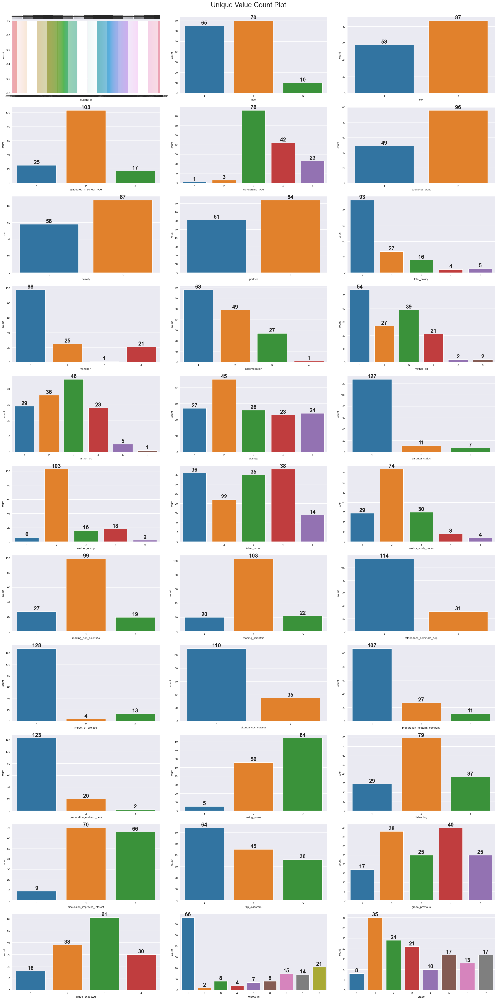

In [11]:
#Prints number of unique values in each column
print(df.nunique())
fig, ax = plt.subplots(int(len(df.columns) / 3), 3, figsize = (25, 50))
ax = ax.flatten()
for i, c in enumerate(df.columns):
    sns.countplot(x = c, data = df, ax = ax[i])
    for p in ax[i].patches:
        ax[i].annotate(format(p.get_height(), '.0f'),
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha = 'center', va = 'center', xytext = (0, 10),
            weight = "bold",fontsize=20,
            textcoords = 'offset points')
            
plt.suptitle('Unique Value Count Plot', y = 1.0, fontsize = 25)
fig.tight_layout()

In [51]:
map_attributes = {

    'age': {

        1: '18-21',

        2: '22-25',

        3: 'Above 26'

    },

    'sex': {1: 'Female', 2: 'Male'},

    'graduated_h_school_type': {

        1: 'Private',

        2: 'State',

        3: 'Other'

    },

    'scholarship_type': {

        1: '0%',

        2: '25%',

        3: '50%',

        4: '75%',

        5: '100%'
    },
    'additional_work': {1: 'Yes', 2: 'No'},

    'activity': {1: 'Yes', 2: 'No'},

    'partner': {1: 'Yes', 2: 'No'},
    
    'total_salary': {

        1: '$135-200',

        2: '$201-270',

        3: '$271-340',

        4: '$341-410',

        5: 'Above $410',

    },

    'transport': {

        1: 'Bus',

        2: 'Private car/taxi',

        3: 'Bicycle',

        4: 'Other'

    },

    'accomodation': {
        1: 'Rental',
        2: 'Dormitory',
        3: 'With family',
        4: 'Other'
    },

    'mother_ed': {
        1: 'Primary school',

        2: 'Secondary school',

        3: 'High school',

        4: 'University',

        5: 'MSc.',

        6: 'Ph.D.'
    },
  
    'farther_ed': {

        1: 'Primary school',

        2: 'Secondary school',

        3: 'High school',

        4: 'University',
        
        5: 'MSc.',

        6: 'Ph.D.'
    },

    'parental_status': {

        1: 'Married',

        2: 'Divorced',

        3: 'Died one of them or both'

    },

    'mother_occup': {

        1: 'Retired',

        2: 'Housewife',

        3: 'Government officer',

        4: 'Private sector employee',

        5: 'Self-employment',

        6: 'Other'
    },

    'father_occup': {

        1: 'Retired',
        2: 'Government officer',

        3: 'Private sector employee',

        4: 'Self-employment',

        5: 'Other'

    },
        
    'weekly_study_hours': {

        1: 'None',
        2: '<5 hours',

        3: '6-10 hours',

        4: '11-20 hours',

        5: 'More than 20 hours'
    },

    'reading_non_scientific': {

        1: 'Never',
        2: 'Sometimes',

        3: 'Often'
    },

    'reading_scientific': {

        1: 'Never',
        2: 'Sometimes',

        3: 'Often'

    },

    'attendance_seminars_dep': {1: 'Yes', 2: 'No'},

    'impact_of_projects': {

        1: 'Positive',

        2: 'Negative',

        3: 'Neutral'

    },

    'attendances_classes': {1: 'Yes', 2: 'No'},

    'preparation_midterm_company': {

        1: 'Alone',

        2: 'With friends',

        3: 'Not applicable'
    },

    'preparation_midterm_time': {

        1: 'Closest date to the exam',

        2: 'Regularly during the semester',

        3: 'Never'

    },

    'taking_notes': {

        1: 'Never',

        2: 'Sometimes',

        3: 'Always'
    },

    'listenning': {

        1: 'Never',

        2: 'Sometimes',

        3: 'Always'
        },

    'discussion_improves_interest': {
        1: 'Never',

        2: 'Sometimes',

        3: 'Always'
    },

    'flip_classrom': {
        1: 'Not useful',

        2: 'Useful',

        3: 'Not applicable'
    }, 
    'grade_previous': {
        1: '<2.00',

        2: '2.00-2.49',

        3: '2.50-2.99',

        4: '3.00-3.49',

        5: 'Above 3.49'
    }, 
    'grade_expected': {

        1: '<2.00',

        2: '2.00-2.49',

        3: '2.50-2.99',

        4: '3.00-3.49',

        5: 'Above 3.49'
    }
}

In [52]:

df.columns = [x.lower() for x in df.columns]

for col in df.columns.tolist():

    if col not in list (map_attributes.keys()):

        continue

    if col=='#_siblings':

        df [col].apply(lambda x: '5 or above' if x == 5 else
str(x))
    else:

        df [col] = df[col].map (map_attributes [col])
print(df.iloc[:,0:11].head().to_string())
print(df.iloc[:,11:18].head().to_string())
print(df.iloc[:,18:25].head().to_string())
print(df.iloc[:,25:33].head().to_string()) 

  student_id    age     sex graduated_h_school_type scholarship_type additional_work activity partner total_salary transport accomodation
0   STUDENT1  22-25    Male                   Other              50%             Yes       No      No     $135-200       Bus       Rental
1   STUDENT2  22-25    Male                   Other              50%             Yes       No      No     $135-200       Bus       Rental
2   STUDENT3  22-25    Male                   State              50%              No       No      No     $201-270     Other    Dormitory
3   STUDENT4  18-21  Female                 Private              50%             Yes       No     Yes     $201-270       Bus    Dormitory
4   STUDENT5  22-25    Male                 Private              50%              No       No     Yes     $271-340       Bus        Other
          mother_ed        farther_ed  siblings parental_status mother_occup     father_occup weekly_study_hours
0    Primary school  Secondary school         3         Mar

In [55]:
def bar_plot (barplot, fontsize=14, num_type=float):
    for bar in barplot.patches:
        position = (bar.get_x() + bar.get_width() / 2,bar.get_height())
        text = f'{bar.get_height():.2f}'
        if num_type == float:
              continue
        else:
            f'{bar.get_height():g}'
            barplot. annotate (text-text, xy-position,ha='center', va='center', size=fontsize,xytext=(0, 8), textcoords='offset points')

In [56]:
def dist_feat_vs_age (feat):

    order = list (map_attributes [feat].values())
    data = df[feat].value_counts(normalize=True) * 100
    data= data.loc[order]

    fig = plt. figure (figsize=(12, 5), constrained_layout=True,facecolor='#ffffc2')
    plt. subplot (121)

    palette = sns.color_palette()

    plt.pie (data, labels=data.index, startangle=90,counterclock=False, autopct='%1.1f%%', colors=palette,textprops={'fontsize': 14})

    data =df.groupby (feat) ['grade'].mean().sort_values (ascending=False)
    
    plt. subplot(122)

    bp = sns.barplot(x=data.index, y=data, order=order, palette=palette)

    bar_plot (barplot=bp)

    plt.xlabel('')

    plt.ylabel('Average grade')

    plt.yticks ([])

    plt.box (False)

    fig.suptitle(feat, fontsize=18)

    plt.show()

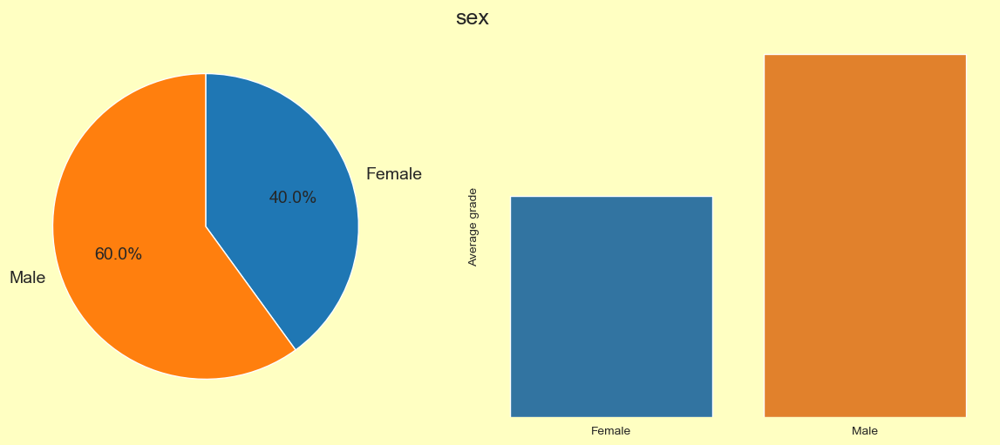

In [57]:
#Plots the distribution of gender and plot its distribution by average grade
dist_feat_vs_age('sex')

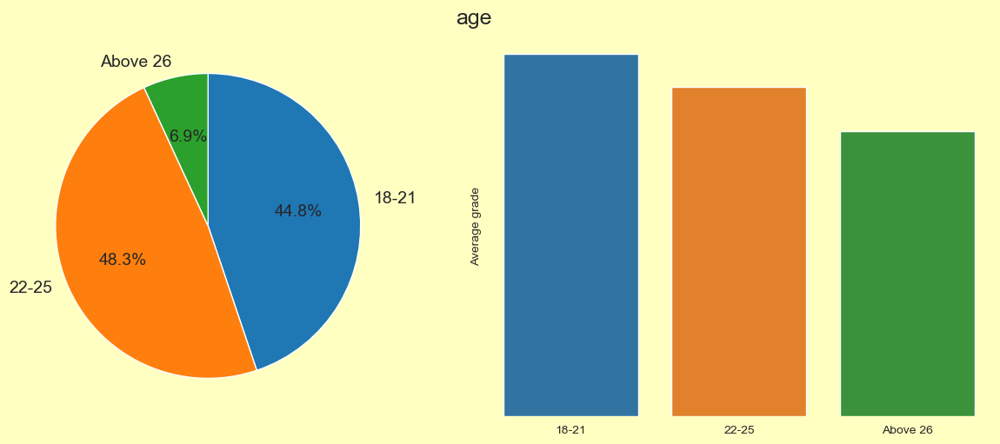

In [58]:
dist_feat_vs_age('age')

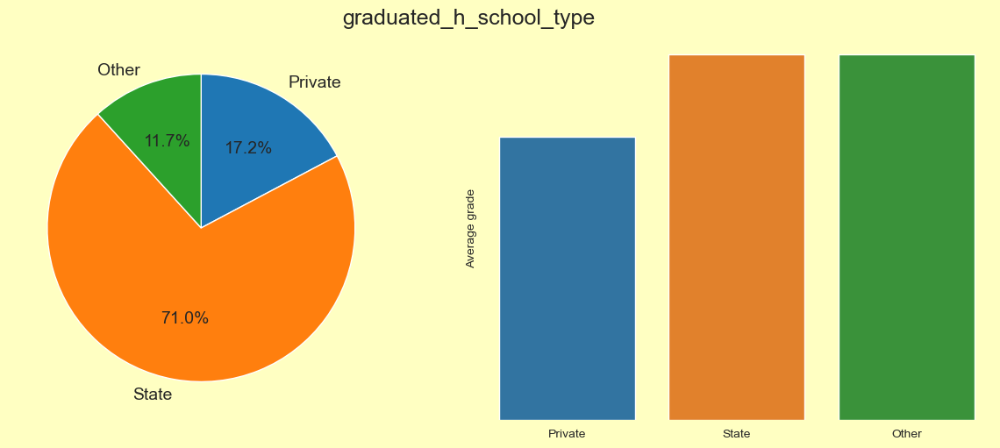

In [59]:
dist_feat_vs_age('graduated_h_school_type')

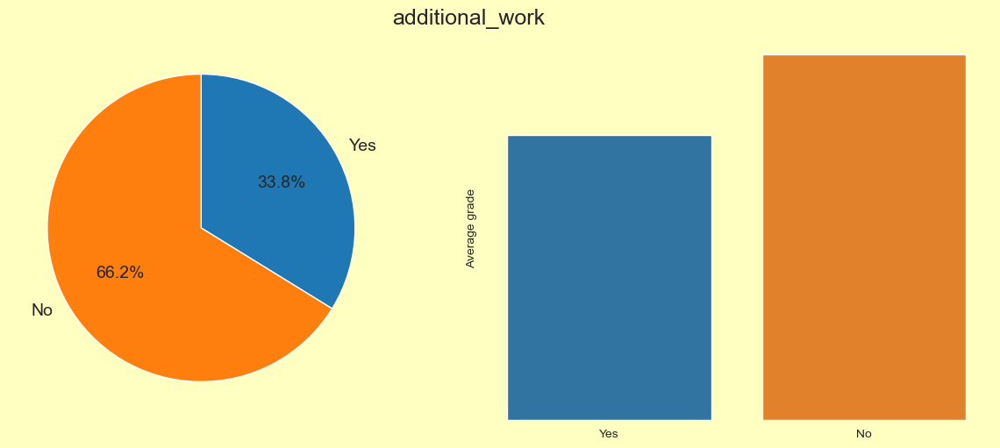

In [60]:
dist_feat_vs_age('additional_work')

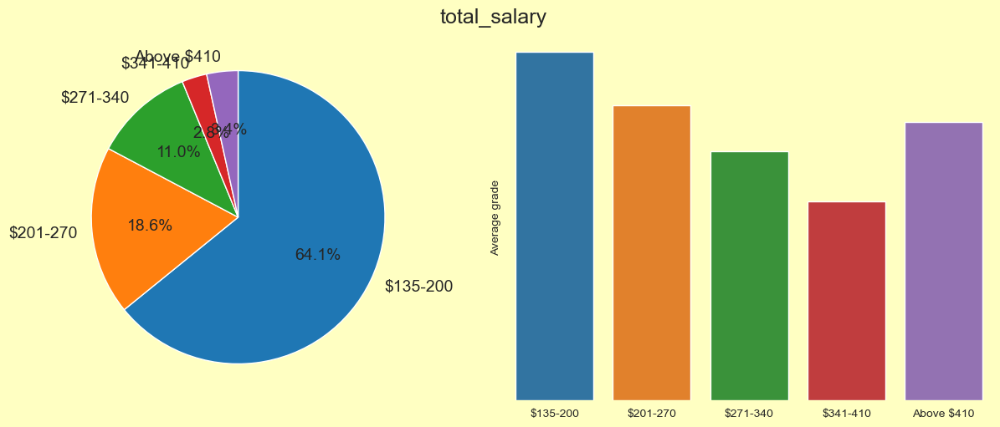

In [61]:
dist_feat_vs_age('total_salary')

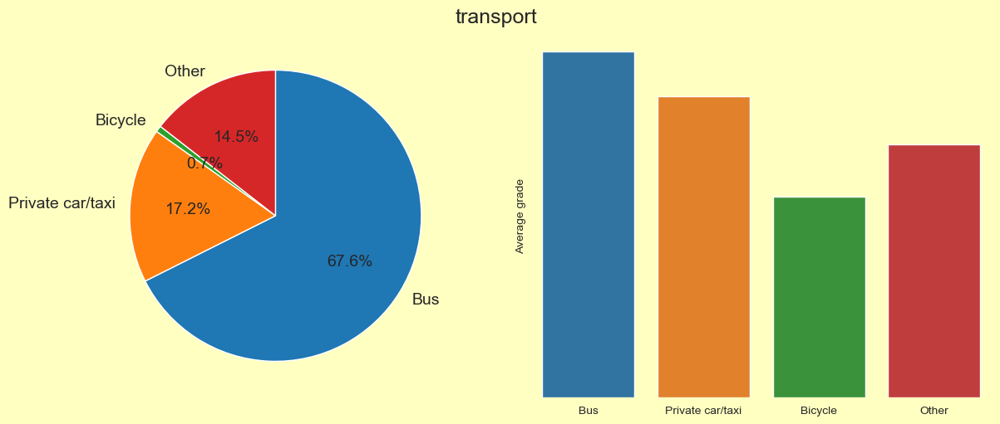

In [62]:
dist_feat_vs_age('transport')

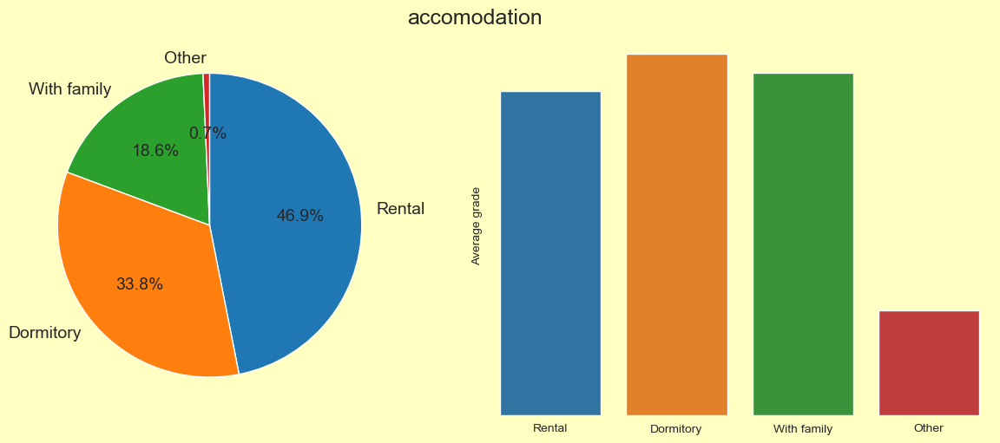

In [63]:
dist_feat_vs_age('accomodation')

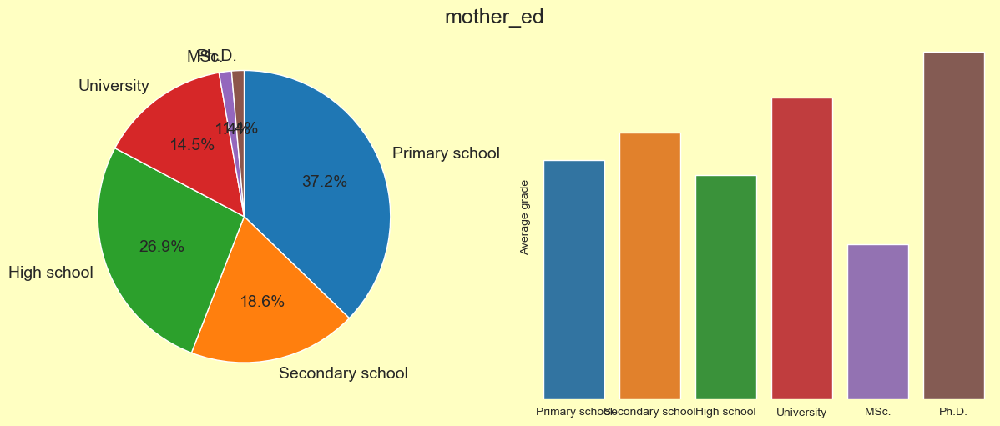

In [64]:
dist_feat_vs_age('mother_ed')

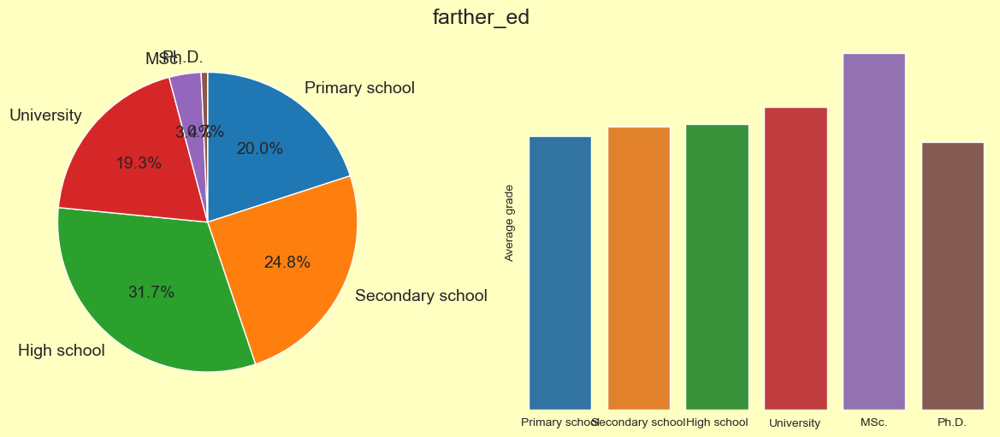

In [65]:
dist_feat_vs_age('farther_ed')

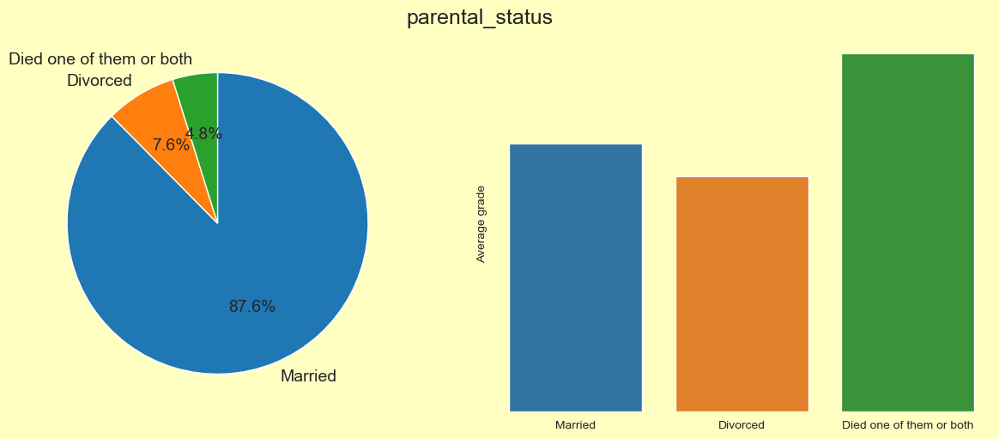

In [66]:
dist_feat_vs_age('parental_status')

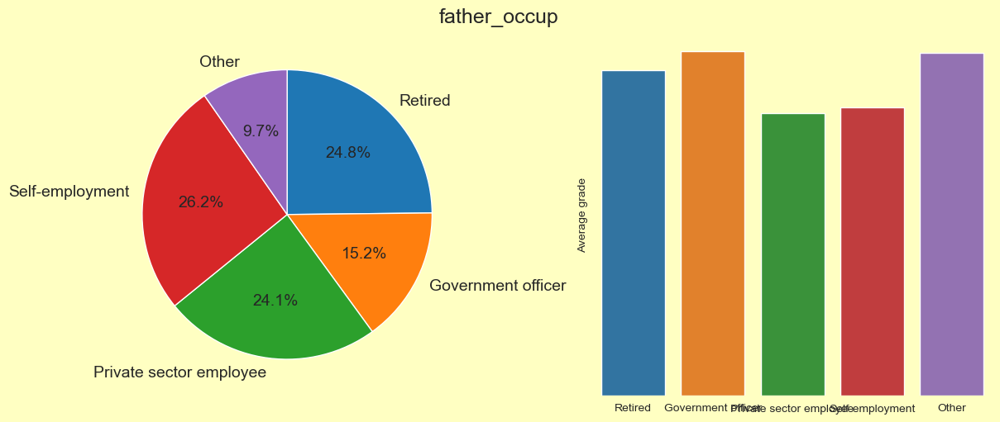

In [67]:
dist_feat_vs_age('father_occup')

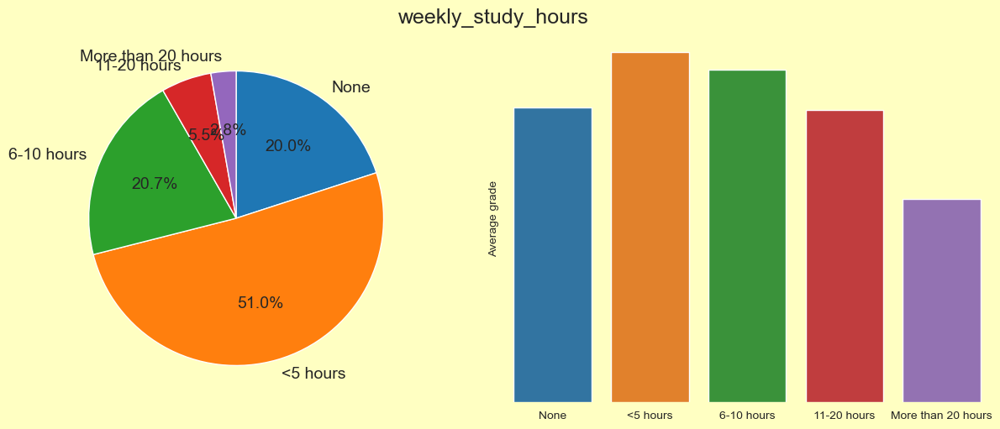

In [68]:
dist_feat_vs_age('weekly_study_hours')

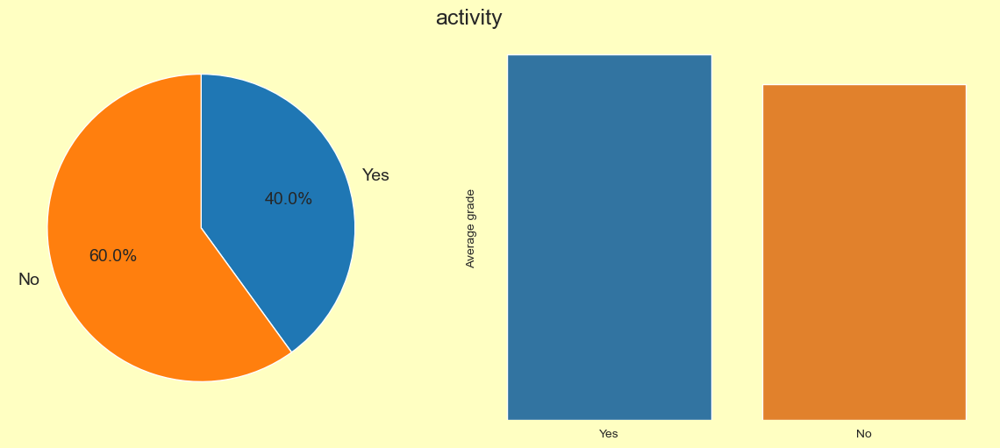

In [69]:
dist_feat_vs_age('activity')

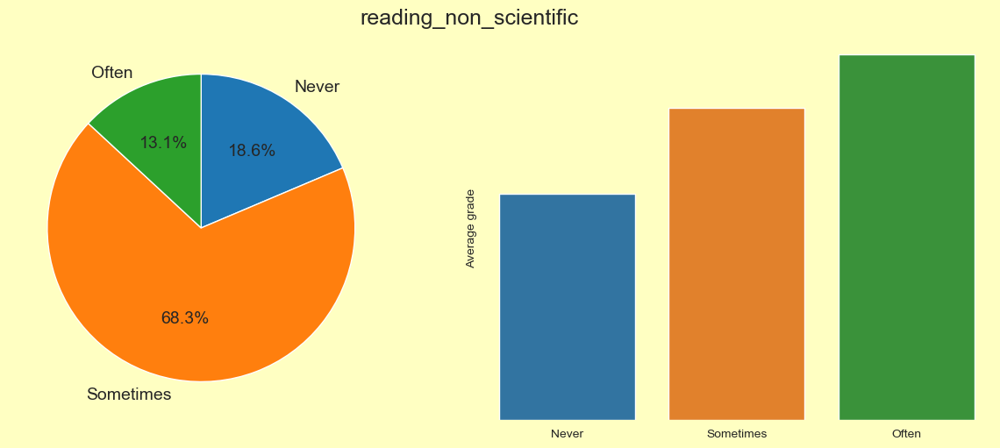

In [70]:
dist_feat_vs_age('reading_non_scientific')

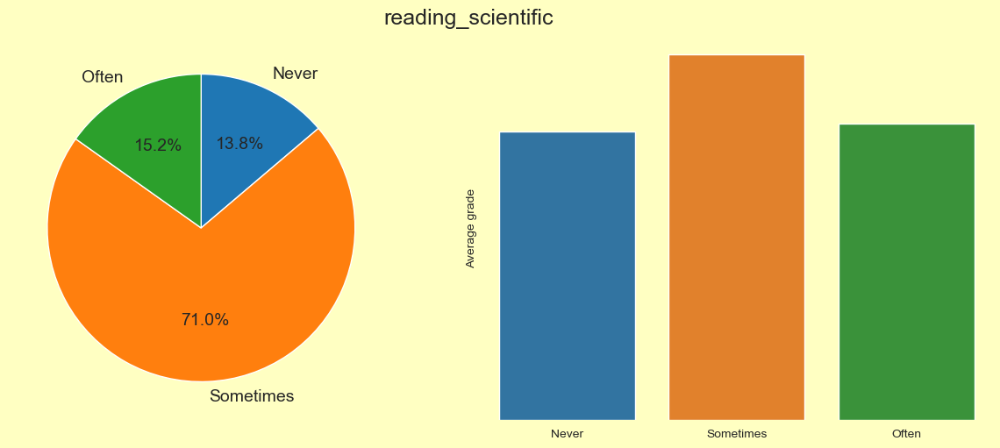

In [71]:
dist_feat_vs_age('reading_scientific')

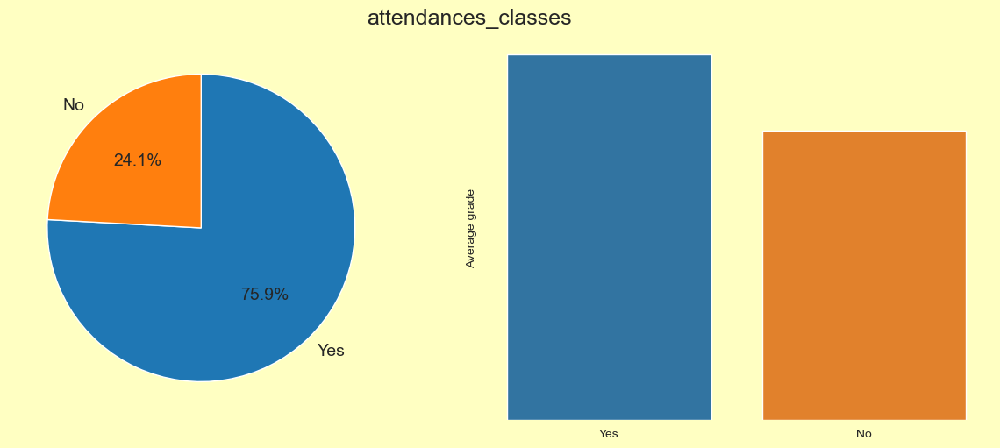

In [72]:
dist_feat_vs_age('attendances_classes')

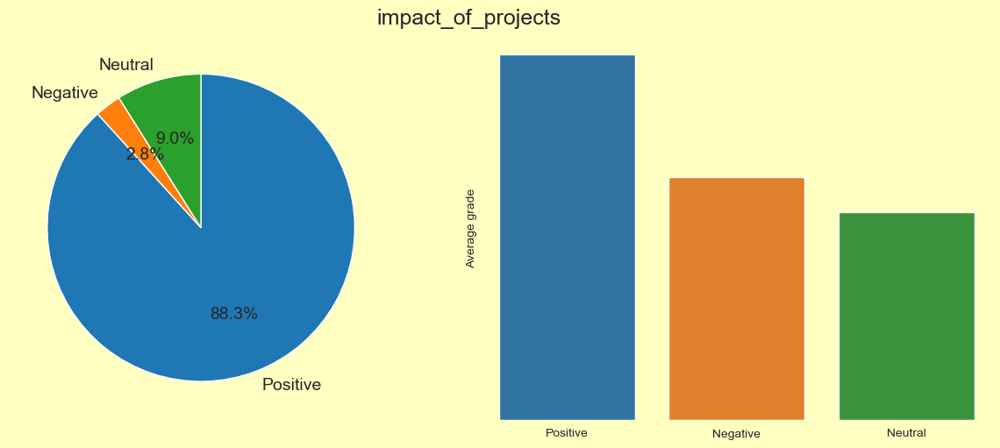

In [73]:
dist_feat_vs_age('impact_of_projects')

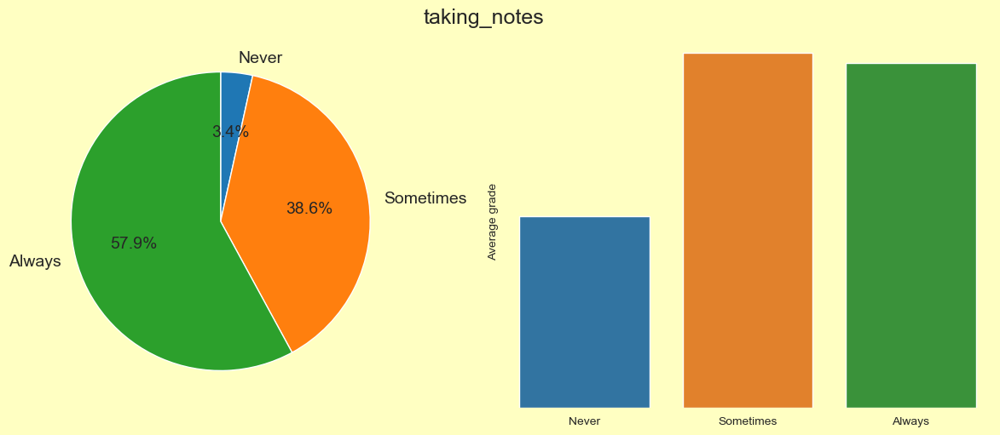

In [74]:
dist_feat_vs_age('taking_notes')

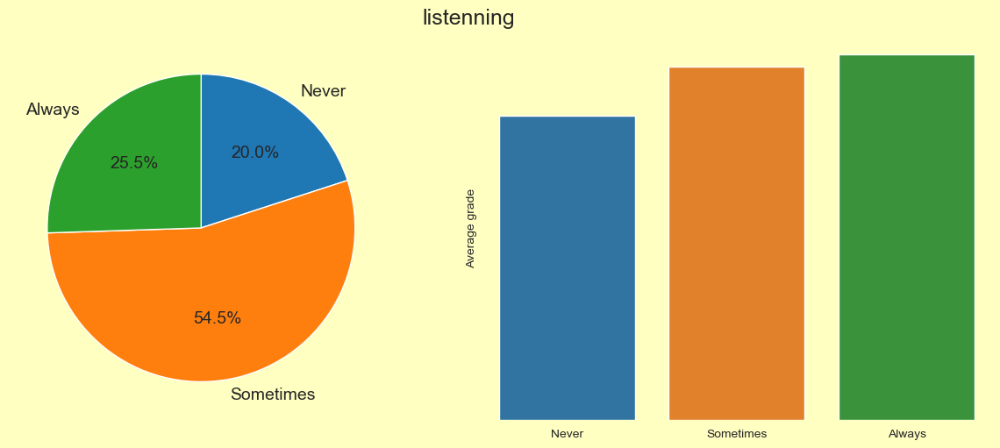

In [75]:
dist_feat_vs_age('listenning')

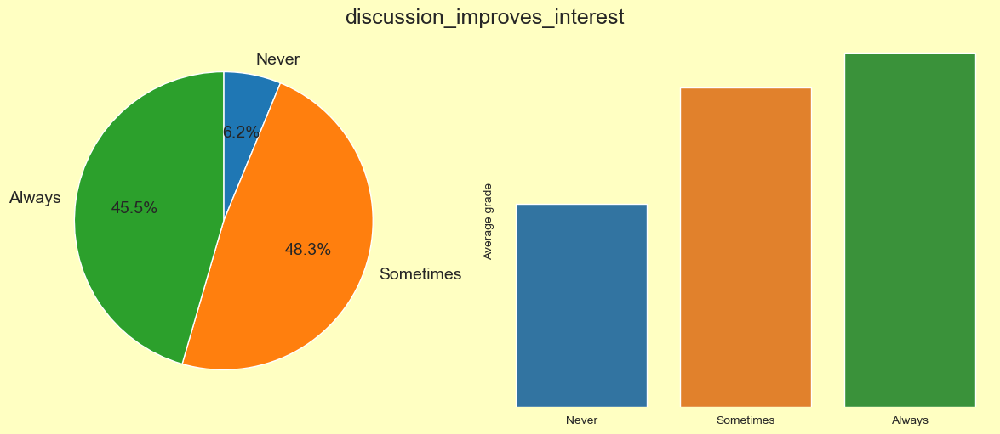

In [76]:
dist_feat_vs_age('discussion_improves_interest')

In [78]:
#Plots distribution of number of cases of all other features versus one feature

def hist_others_versus_one_feat(columns, df, one_feat):

    ROWS=8

    COLS=4

    fig, ax = plt. subplots (ROWS, COLS, figsize=(60,40),constrained_layout=True, facecolor='#fbe7dd')

    for i in range (ROWS):
        for j in range (COLS):
            #g=sns.countplot(df[columns[COLS*i+j]], hue df[one_feat], palette='Spectral', ax=ax[i,j])
            g=sns.countplot(df[columns[COLS*i+j]], hue=df[one_feat], palette='Spectral_r', ax=ax[i,j])
            #g=sns.countplot(df[columns[COLS*i+j]],palette='Spectral')
            g.xaxis.get_label().set_fontsize(30)
            for p in g.patches:
                g.annotate(format(p.get_height(),'.0f'),(p.get_x()+p.get_width() / 2., p.get_height()),ha='center',va='center', xytext=(0, 10), weight="bold", fontsize=30,textcoords='offset points')
    plt.show()


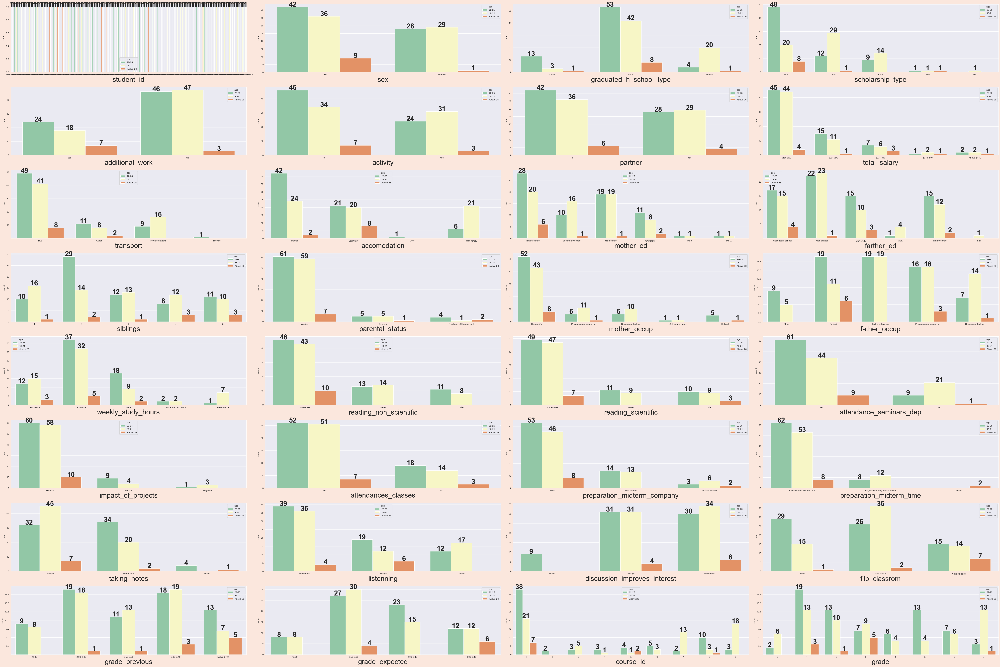

In [21]:

#Plots the distribution of other features versus school feature

cols= list(df.columns)

cols.remove("age")

hist_others_versus_one_feat (cols, df, "age")

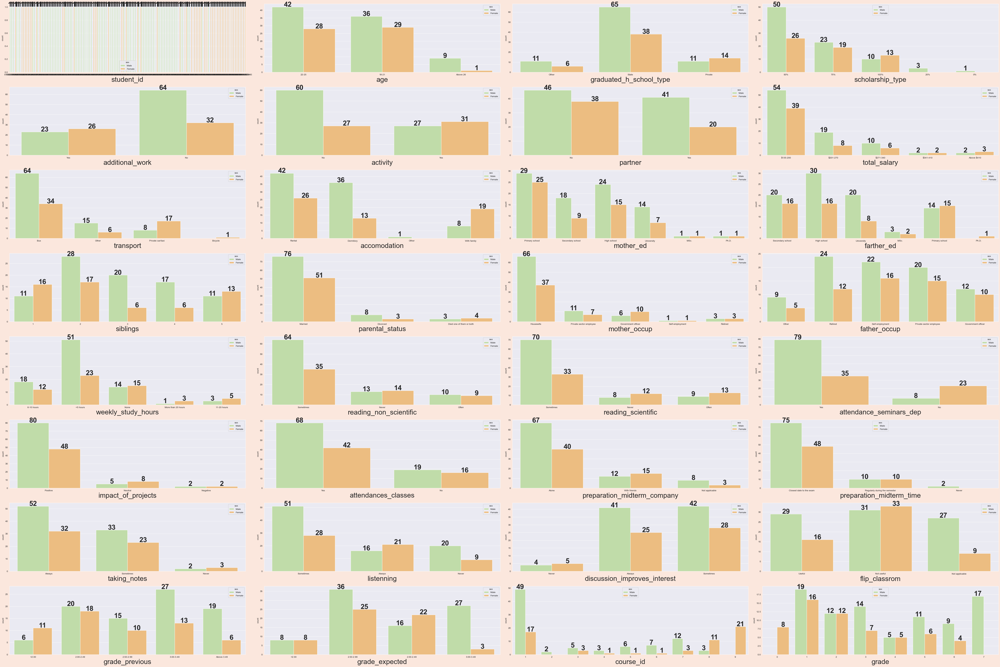

In [79]:
cols= list(df.columns)

cols.remove("sex")

hist_others_versus_one_feat (cols, df, "sex")

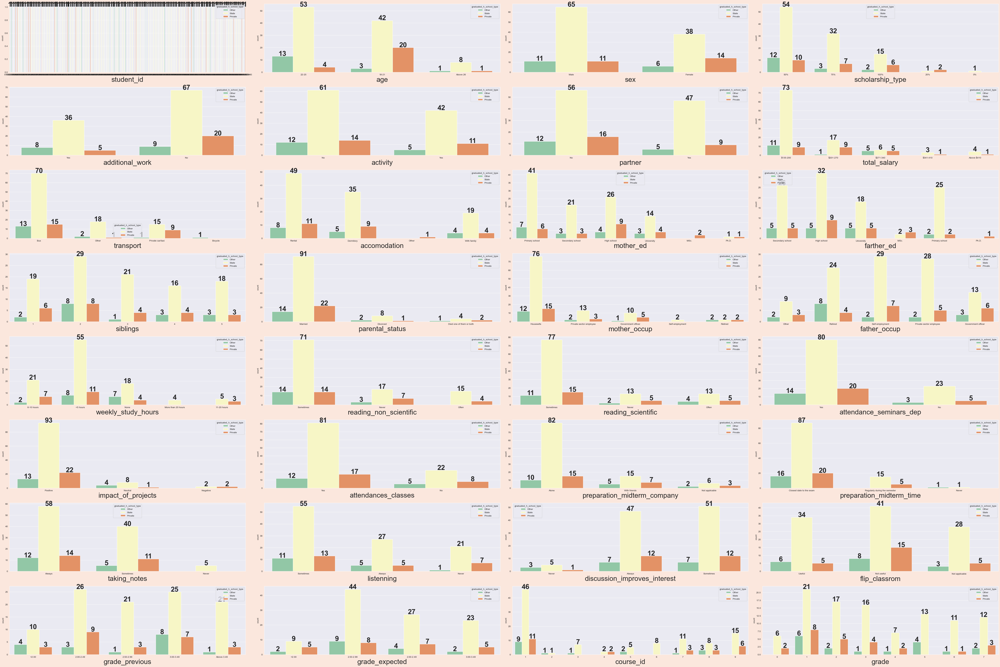

In [80]:
cols= list(df.columns)

cols.remove("graduated_h_school_type")

hist_others_versus_one_feat (cols, df, "graduated_h_school_type")

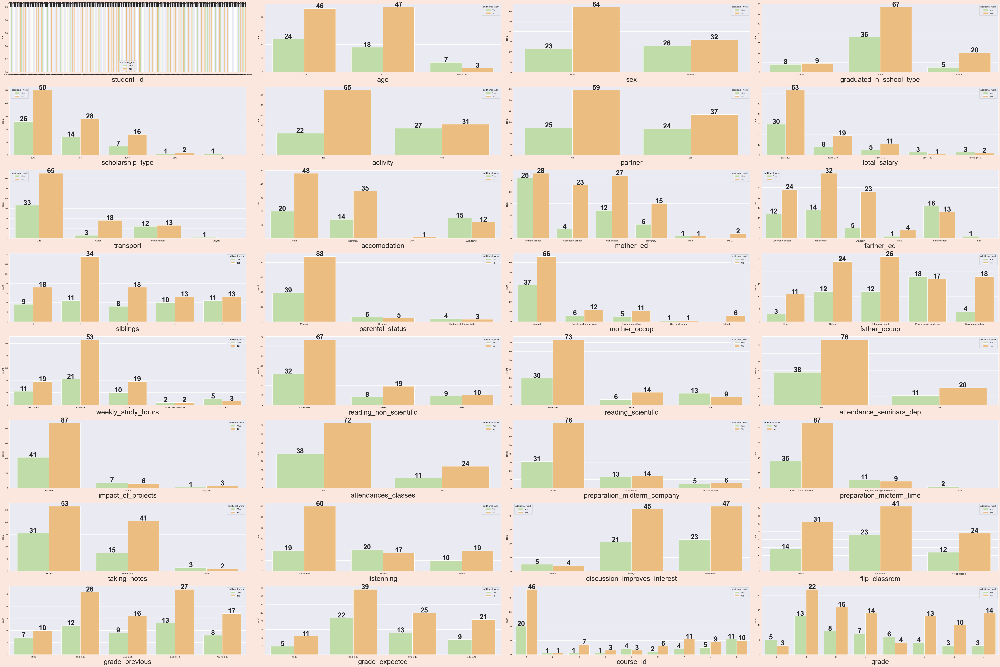

In [81]:
cols= list(df.columns)

cols.remove("additional_work")

hist_others_versus_one_feat (cols, df, "additional_work")

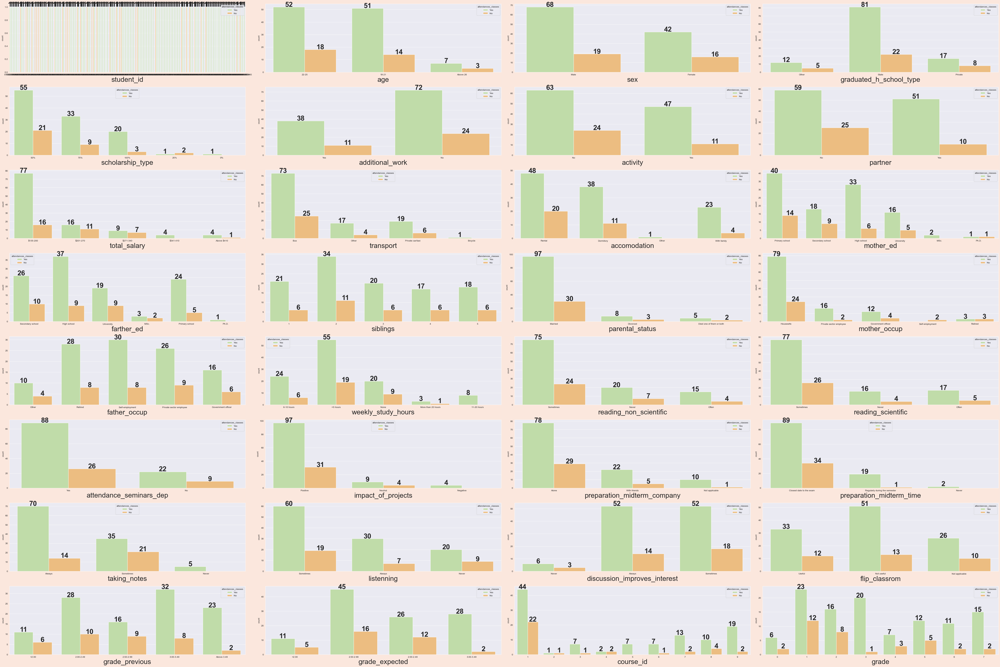

In [82]:
cols= list(df.columns)

cols.remove("attendances_classes")

hist_others_versus_one_feat (cols, df, "attendances_classes")

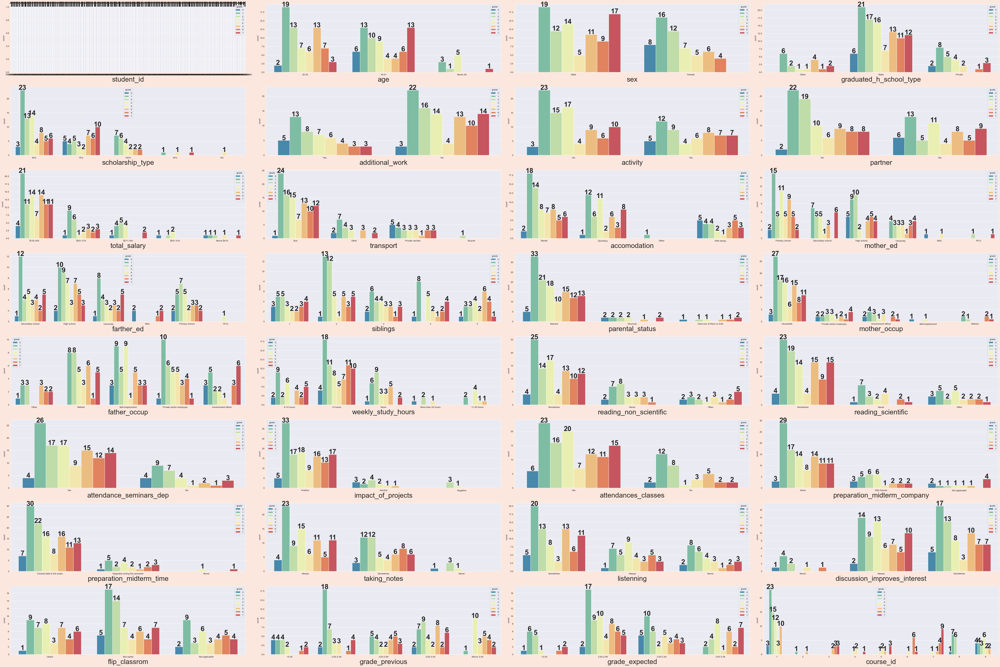

In [83]:
cols= list(df.columns)

cols.remove("grade")

hist_others_versus_one_feat (cols, df, "grade")

# بخش بعدی  اتمام مرحله اول

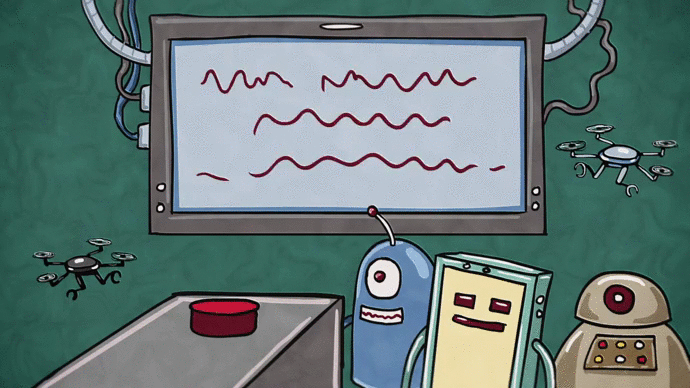

In [4]:
#Reads dataset
curr_path = os.getcwd()
df = pd.read_csv(curr_path+"/DATA3.csv",sep=';')
#df =pd.read_csv('C://Users//Arash//Desktop//T1//DATA3.csv',sep=';')
#Converts column names into lowercase
df.columns = [x.lower() for x in df.columns]
#Drops studentid column
df=df.drop("student_id", axis = 1)
#Prints head of dataset
print(df.iloc[:,0:11]. head ().to_string())
print(df.iloc[:, 11:18]. head().to_string())
print(df.iloc[:, 18:25]. head().to_string())
print(df.iloc[:, 25:32]. head().to_string())

   age  sex  graduated_h_school_type  scholarship_type  additional_work  activity  partner  total_salary  transport  accomodation  mother_ed
0    2    2                        3                 3                1         2        2             1          1             1          1
1    2    2                        3                 3                1         2        2             1          1             1          2
2    2    2                        2                 3                2         2        2             2          4             2          2
3    1    1                        1                 3                1         2        1             2          1             2          1
4    2    2                        1                 3                2         2        1             3          1             4          3
   farther_ed  siblings  parental_status  mother_occup  father_occup  weekly_study_hours  reading_non_scientific
0           2         3                1 

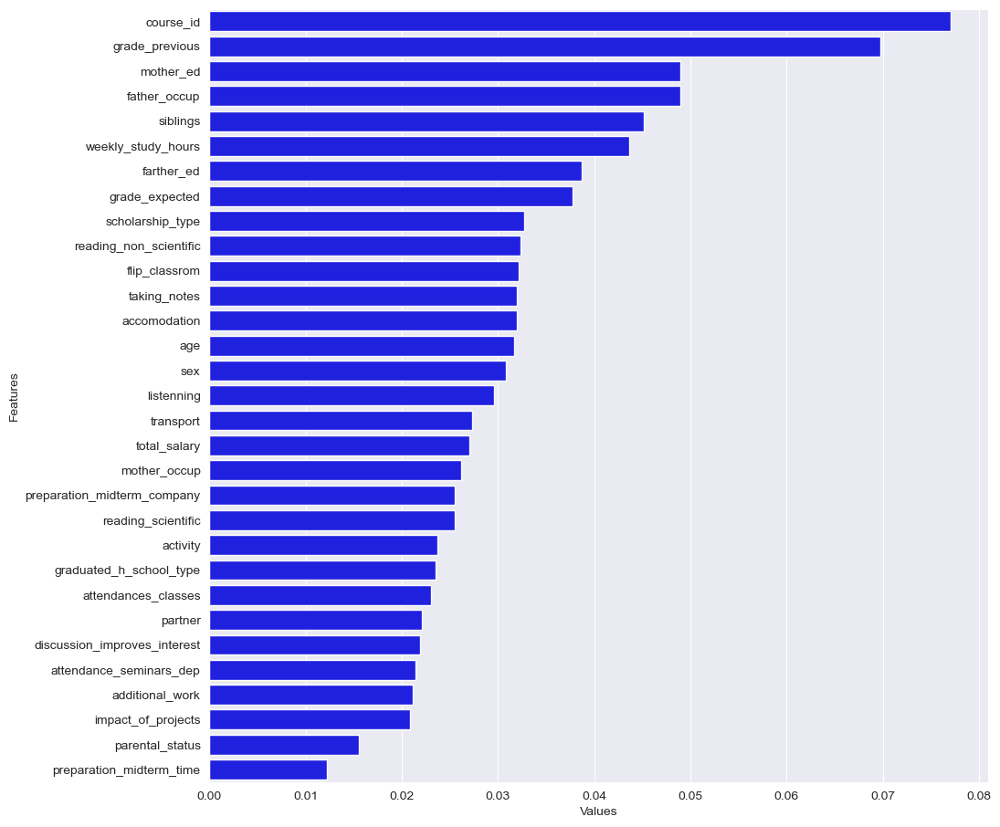

In [12]:
#Feature Importance using Random Forest Classifier

#Extracts output and input variables

y = df['grade'].values# Target for the model

X = df.drop (['grade'], axis = 1)

names= X.columns

rf= RandomForestClassifier()

rf.fit(X, y)

result_rf = pd.DataFrame()

result_rf['Features']= X.columns

result_rf ['Values']=rf.feature_importances_

result_rf.sort_values('Values', inplace = True, ascending = False)

plt.figure(figsize=(11,11))

sns.set_color_codes ("pastel")

sns.barplot (x = 'Values', y = 'Features', data=result_rf, color="Blue")

plt.show()

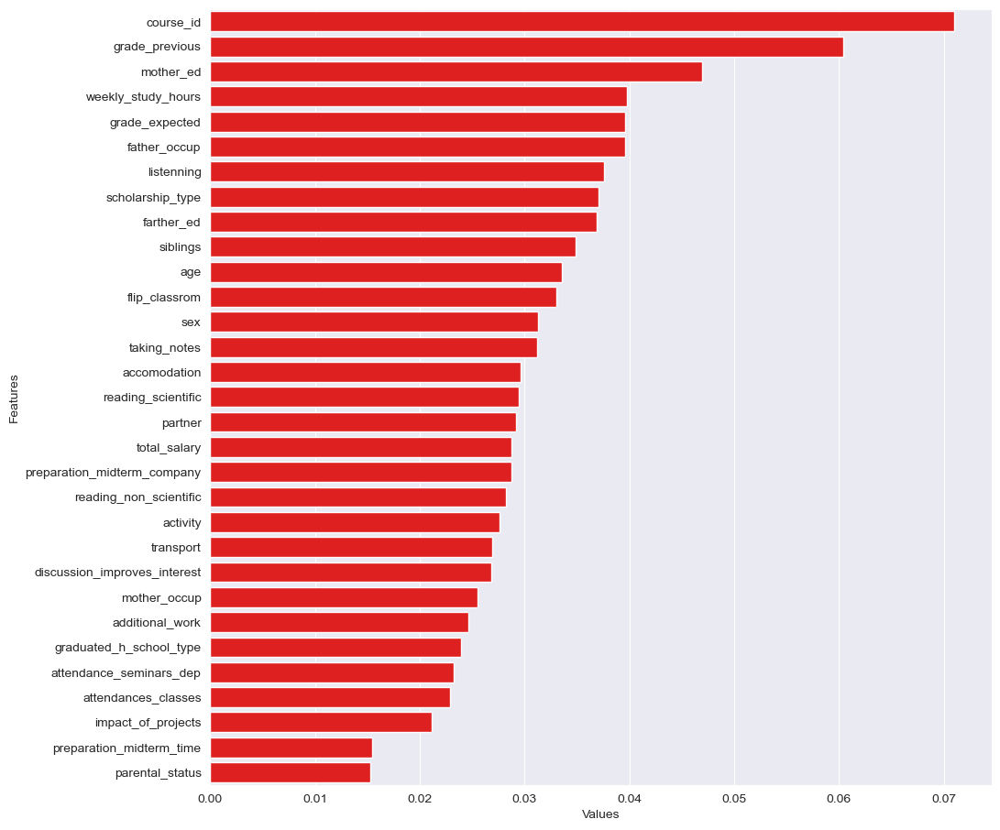

In [8]:
#Feature Importance using ExtraTreesClassifier

model=ExtraTreesClassifier()
model.fit (X, y)
result_et = pd.DataFrame()
result_et['Features']= X.columns
result_et['Values'] = model.feature_importances_
result_et.sort_values('Values', inplace = True, ascending = False)

plt.figure(figsize=(11,11))
sns.set_color_codes ("pastel")
sns.barplot (x = 'Values', y = 'Features', data=result_et, color="red")
plt.show()

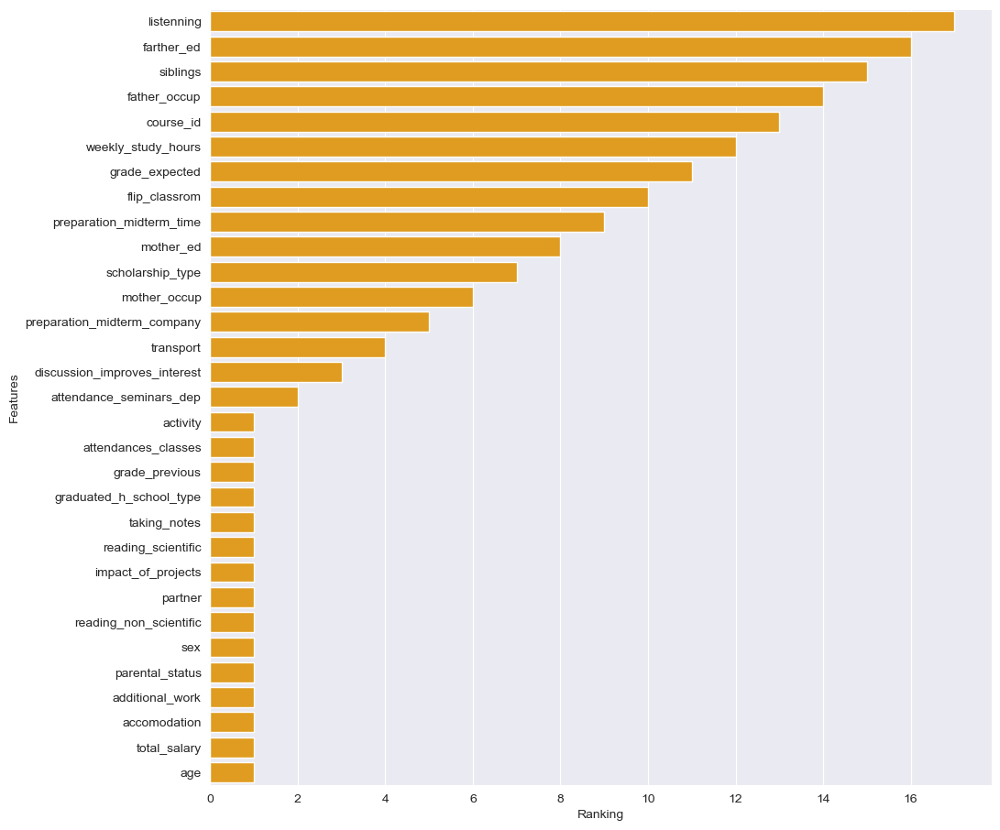

In [9]:
from sklearn.feature_selection import RFE
model=LogisticRegression()
rfe= RFE(model)

rfe= rfe.fit(X, y)
result_lg = pd.DataFrame()
result_lg['Features'] = X.columns

result_lg ['Ranking'] = rfe.ranking_

result_lg.sort_values('Ranking', inplace=True, ascending = False)

plt.figure(figsize=(11,11))

sns.set_color_codes ("pastel")

sns.barplot (x = 'Ranking', y = 'Features', \

data=result_lg, color="orange")

plt.show()

In [10]:
most_correlated =df.corr().abs()['grade'].sort_values(ascending=False)
print(most_correlated)

grade                           1.000000
sex                             0.335533
grade_previous                  0.315493
grade_expected                  0.248588
impact_of_projects              0.203273
reading_non_scientific          0.195617
attendance_seminars_dep         0.184763
additional_work                 0.167445
total_salary                    0.166352
transport                       0.156289
discussion_improves_interest    0.146547
course_id                       0.142166
attendances_classes             0.139564
flip_classrom                   0.110617
graduated_h_school_type         0.104821
age                             0.095251
listenning                      0.085137
siblings                        0.084470
preparation_midterm_time        0.073783
parental_status                 0.066379
mother_ed                       0.066318
farther_ed                      0.063504
activity                        0.062993
partner                         0.051778
taking_notes    

In [30]:
def split_data(X, y):

    #Resamples data using SMOTE

    sm= SMOTE(random_state=42)

    X, y = sm.fit_resample (X, y.ravel())

    #Splits the data into training and testing

    X_train, X_test, y_train, y_test= train_test_split(X, y,test_size = 0.3, random_state = 2021, stratify=y)

    #Raw data

    X_train_raw = X_train.copy()

    X_test_raw = X_test.copy()

    y_train_raw = y_train.copy()
    
    y_test_raw = y_test.copy()

    #Saves into pkl files

    joblib.dump (X_train_raw, 'X_train_raw.pkl')

    joblib.dump (X_test_raw, 'X_test_raw.pkl')

    joblib. dump(y_train_raw, 'y_train_raw.pkl')

    joblib.dump(y_test_raw, 'y_test_raw.pkl')

    #Use MinMax Scaler

    X_train_norm = X_train.copy()

    X_test_norm = X_test.copy()

    y_train_norm = y_train.copy()

    y_test_norm = y_test.copy()

    norm = MinMaxScaler()

    X_train_norm = norm.fit_transform (X_train_norm)

    X_test_norm = norm.transform(X_test_norm)

    #Saves into pkl files

    joblib.dump (X_train_norm, 'X_train_norm.pkl')

    joblib.dump (X_test_norm, 'X_test_norm.pkl')

    joblib.dump(y_train_norm,'y_train_norm.pkl')

    joblib.dump(y_test_norm, 'y_test_norm.pkl')

    #Use Standard Scaler

    X_train_stand = X_train.copy()

    X_test_stand = X_test.copy ()

    y_train_stand = y_train.copy()

    y_test_stand = y_test.copy()

    scaler= StandardScaler ()

    X_train_stand = scaler.fit_transform(X_train_stand)
   
    X_test_stand = scaler. transform (X_test_stand)
    
    #Saves into pkl files

    joblib.dump(X_train_stand, 'X_train_stand.pkl')
    print(joblib.dump(X_train_stand, 'X_train_stand.pkl'))
    joblib.dump(X_test_stand, 'X_test_stand.pkl')

    joblib.dump(y_train_stand,'y_train_stand.pkl')

    joblib.dump(y_test_stand, 'y_test_stand.pkl')


def load_raw_files():
    curr_path = os.getcwd()
    print(curr_path)
    X_train_raw = joblib.load('X_train_raw.pkl')

    X_test_raw = joblib.load('X_test_raw.pkl')

    y_train_raw = joblib.load('y_train_raw.pkl')
    
    y_test_raw =joblib.load('y_test_raw.pkl')

    return X_train_raw, X_test_raw, y_train_raw, y_test_raw


def load_norm_files():

    X_train_norm = joblib.load('X_train_norm.pkl')

    X_test_norm = joblib.load('X_test_norm.pkl')

    y_train_norm = joblib.load('y_train_norm.pkl')

    y_test_norm = joblib.load('y_test_norm.pkl')

    return X_train_norm, X_test_norm, y_train_norm, y_test_norm


def load_stand_files():

    X_train_stand = joblib.load('X_train_stand.pkl')

    X_test_stand = joblib.load('X_test_stand.pkl')

    y_train_stand = joblib.load('y_train_stand.pkl')

    y_test_stand = joblib.load('y_test_stand.pkl')

    return X_train_stand, X_test_stand, y_train_stand, y_test_stand
###########
#Loads or creates raw, normalized, and standardized train and test sets
import pathlib
import os
from imblearn.over_sampling import SMOTE
if os.path.isfile('X_train_stand.pkl'):
    print("OOOOOKKK")
    X_train_raw, X_test_raw, y_train_raw, y_test_raw = load_raw_files ()

    X_train_norm, X_test_norm, y_train_norm, y_test_norm= load_norm_files ()

    X_train_stand, X_test_stand, y_train_stand, y_test_stand = load_stand_files()

else:
    print("NOOOOO")
    
    split_data(X,y)
#########################
def plot_learning_curve (estimator, name, fc, X, y, axes=None,ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0,5)):

    if axes is None:

        _, axes = plt.subplots (1, 3, figsize=(20, 5))

    axes[0].set_title(name+" with "+ fc + " scaling", fontsize=15)

    if ylim is not None:

        axes[0].set_ylim(*ylim)

    axes[0].set_xlabel("Training examples")

    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve (estimator, X, y, cv=cv, n_jobs=n_jobs,train_sizes=train_sizes,return_times=True)

    train_scores_mean= np.mean(train_scores, axis=1)

    train_scores_std = np.std(train_scores, axis=1)    
           
    test_scores_mean = np. mean(test_scores, axis=1)

    test_scores_std = np. std (test_scores, axis=1)

    fit_times_mean= np.mean(fit_times, axis=1)

    fit_times_std = np. std (fit_times, axis=1)

    # Plot learning curve

    axes[0].grid()

    axes[0].fill_between(train_sizes, train_scores_mean-train_scores_std ,train_scores_mean+train_scores_std,alpha=0.1, color="r")

    axes[0].fill_between(train_sizes, test_scores_mean-test_scores_std,test_scores_mean+test_scores_std, alpha=0.1, color="g")

    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")

    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times

    axes[1].grid()

    axes[1].plot(train_sizes, fit_times_mean, 'o-')

    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,fit_times_mean + fit_times_std, alpha=0.1)

    axes[1].set_xlabel("Training examples")

    axes[1].set_ylabel("fit_times")

    axes[1].set_title("Scalability of the model of " +name+" with " + fc + "scaling", fontsize=15)

    # Plot fit_time vs score

    axes[2].grid()

    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')

    axes[2].fill_between(fit_times_mean,test_scores_mean - test_scores_std,test_scores_mean + test_scores_std, alpha=0.1)

    axes[2].set_xlabel("fit_times")

    axes[2].set_ylabel("Score")

    axes[2].set_title("Performance of the model of "+name+" with " + fc + "scaling", fontsize=15)

    return plt
########
def plot_real_pred_val(Y_test, ypred, name, fc):

    plt.figure (figsize=(15,10))
    acc=accuracy_score(Y_test, ypred)

    plt.scatter(range (len (ypred)), ypred, color="blue",lw=5, label="Predicted")

    plt. scatter (range (len (Y_test)),Y_test, color="red", label="Actual")

    plt.title("Predicted Values vs True Values of "+name+" with " + fc + " scaling",fontsize=20)

    plt.xlabel("Accuracy: "+ str(round((acc*100), 3)) +"%", fontsize=28)

    plt.ylabel("Cluster", fontsize=20)

    plt. legend (fontsize=20)

    plt.grid (True, alpha=0.75, lw=1, ls='-.')

    plt.show()


def plot_cm(Y_test, ypred, name, fc):

    plt. figure (figsize=(15,10))

    ax= plt. subplot()

    cm = confusion_matrix(Y_test, ypred)

    sns.heatmap (cm, annot=True, linewidth=0.7,linecolor='red', fmt='g')

    plt. title (name +' Confusion Matrix'+" with " + fc + "scaling", fontsize=20)

    plt.xlabel('Y predict')

    plt.ylabel('Y test')

    ax.xaxis.set_ticklabels(['Fail','DD', 'DC', 'CC','CB', 'BB', 'BA', 'AA']);

    ax.yaxis.set_ticklabels(['Fail','DD', 'DC', 'CC','CB', 'BB', 'BA', 'AA']);

    plt.show()

    return cm
#######################
def plot_decision_boundary (model, xtest, ytest, name, fc):

    #Trains model with two features

    model.fit(xtest, ytest)

    plt.figure (figsize=(15,10))

    plot_decision_regions (xtest. values, ytest.ravel(), clf=model, legend=2)

    plt.title("Decision boundary for " + name +" (Test)"+" with " + fc + " scaling", fontsize=20)

    plt.xlabel('weekly_study_hours')

    plt.ylabel('grade_expected')

    plt.legend (fontsize=20)

    plt.show()
#Chooses two features for decision boundary

feat_boundary = ['weekly_study_hours', 'grade_expected']

X_feature= X[feat_boundary]

X_train_feat, X_test_feat, y_train_feat, y_test_feat = train_test_split(X_feature, y, test_size = 0.3,random_state = 2021, stratify=y)
###############
def train_model(model, X, y):

    model.fit(X, y)

    return model

def predict_model(model, X, proba=False):

    if ~proba:

        y_pred = model.predict(X)

    else:

        y_pred_proba = model.predict_proba(X)

        y_pred = np.argmax (y_pred_proba, axis=1)

    return y_pred

list_scores = []

def run_model(name, model, X_train, X_test, y_train, y_test, fc, proba=False):

    print(name)

    print(fc)

    model= train_model(model, X_train, y_train)

    y_pred =predict_model(model, X_test, proba)

    accuracy =accuracy_score(y_test, y_pred)

    recall= recall_score(y_test, y_pred, average='weighted')

    precision= precision_score(y_test, y_pred, average='weighted')

    f1 = f1_score(y_test, y_pred, average='weighted')

    print('accuracy: ', accuracy)

    print('recall: ', recall)

    print('precision: ', precision)

    print('f1: ',f1)

    print(classification_report (y_test, y_pred))
    
    plot_cm(y_test, y_pred, name, fc)


    plot_real_pred_val(y_test,y_pred, name, fc)

    #plot_roc(model, X_test, y_test, name)

    plot_decision_boundary (model,X_test_feat,y_test_feat, name, fc)

    plot_learning_curve (model, name, fc, X_train, y_train, cv=3);

    plt.show()



    list_scores.append({'Model Name': name,'Feature Scaling': fc, 'Accuracy': accuracy,'Recall': recall, 'Precision': precision, 'F1':f1})
    print('uuu',list_scores,X_train_raw)

#     feature_scaling ={
#         'Raw': (X_train_raw, X_test_raw, y_train_raw, y_test_raw),
#         'Normalization': (X_train_norm, X_test_norm, y_train_norm, y_test_norm),
#         'Standardization': (X_train_stand, X_test_stand, y_train_stand, y_test_stand),
#     }
#     print("nnn",feature_scaling.items())







OOOOOKKK
C:\Users\Arash\Desktop\T1


OOOOOKKK
C:\Users\Arash\Desktop\T1
SVC
Raw
accuracy:  0.7023809523809523
recall:  0.7023809523809523
precision:  0.7293628990057561
f1:  0.6987716601560995
              precision    recall  f1-score   support

           0       0.91      0.91      0.91        11
           1       0.71      0.45      0.56        11
           2       0.64      0.90      0.75        10
           3       0.62      0.80      0.70        10
           4       0.75      0.55      0.63        11
           5       0.46      0.55      0.50        11
           6       1.00      0.60      0.75        10
           7       0.75      0.90      0.82        10

    accuracy                           0.70        84
   macro avg       0.73      0.71      0.70        84
weighted avg       0.73      0.70      0.70        84



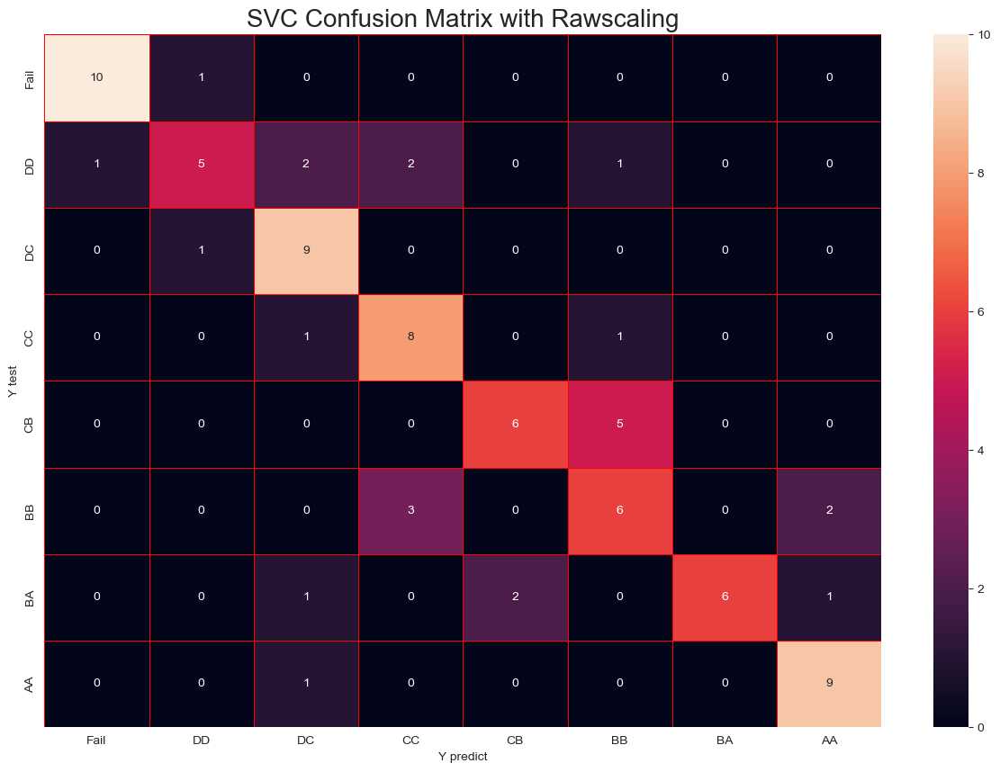

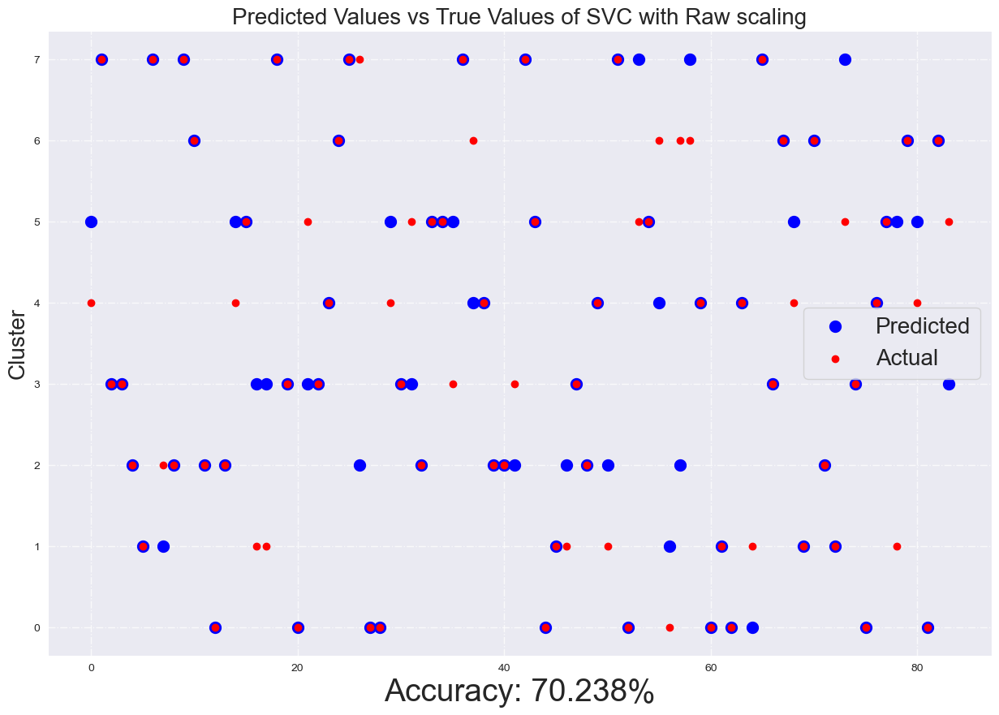

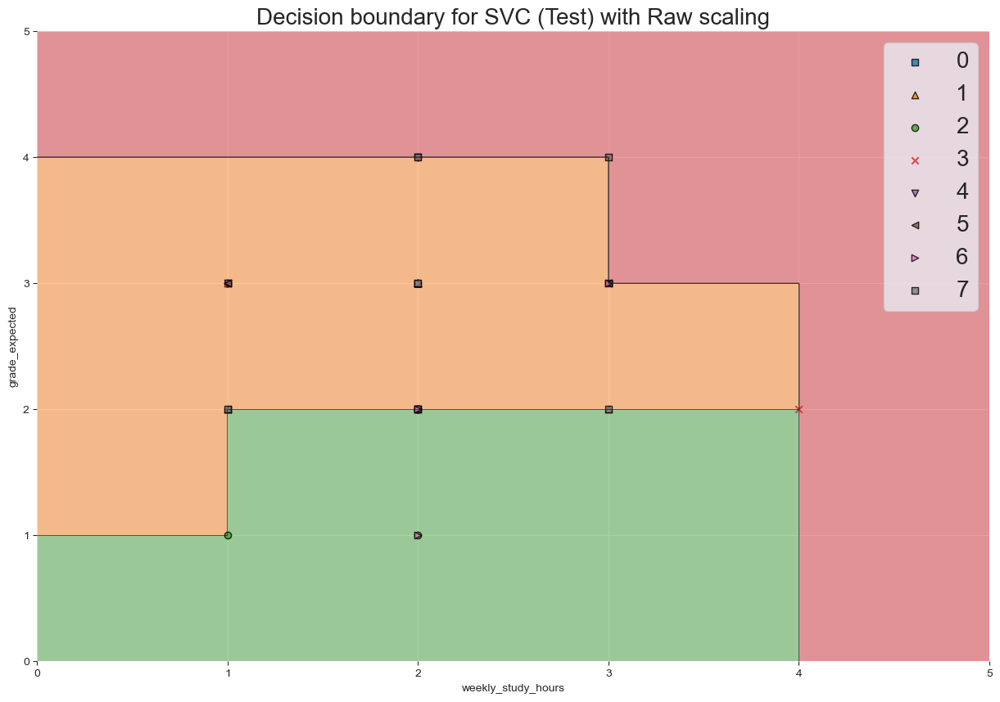

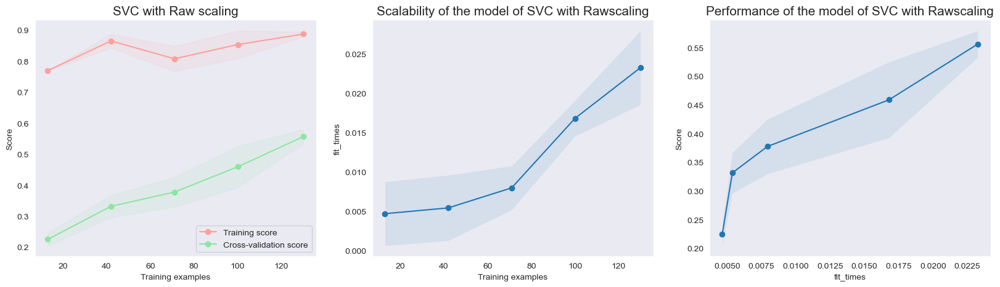

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}]      age  sex  graduated_h_school_type  scholarship_type  additional_work  \
88     1    2                        2                 4                2   
63     2    2                        2                 4                2   
40     1    2                        1                 3                2   
273    1    2                        2                 3                2   
71     1    1                        3                 4                2   
..   ...  ...                      ...               ...              ...   
62     2    2                        2                 3                2   
193    1    1                        2                 3                1   
15     2    2                        2                 3                2   
224    1    1                        2                 

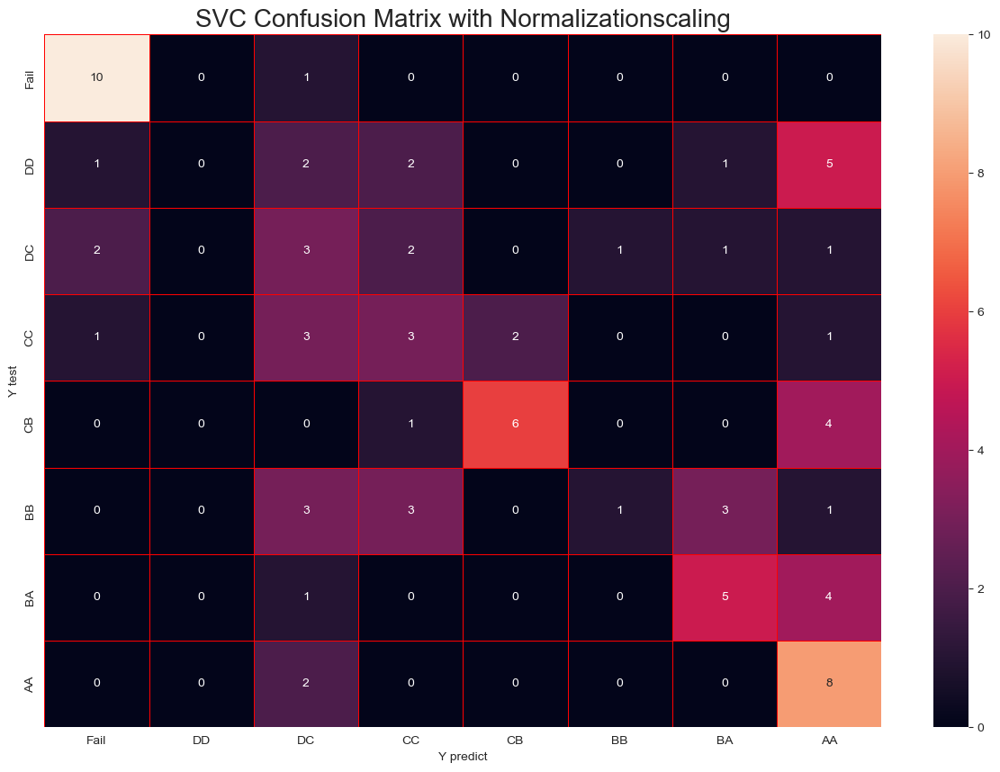

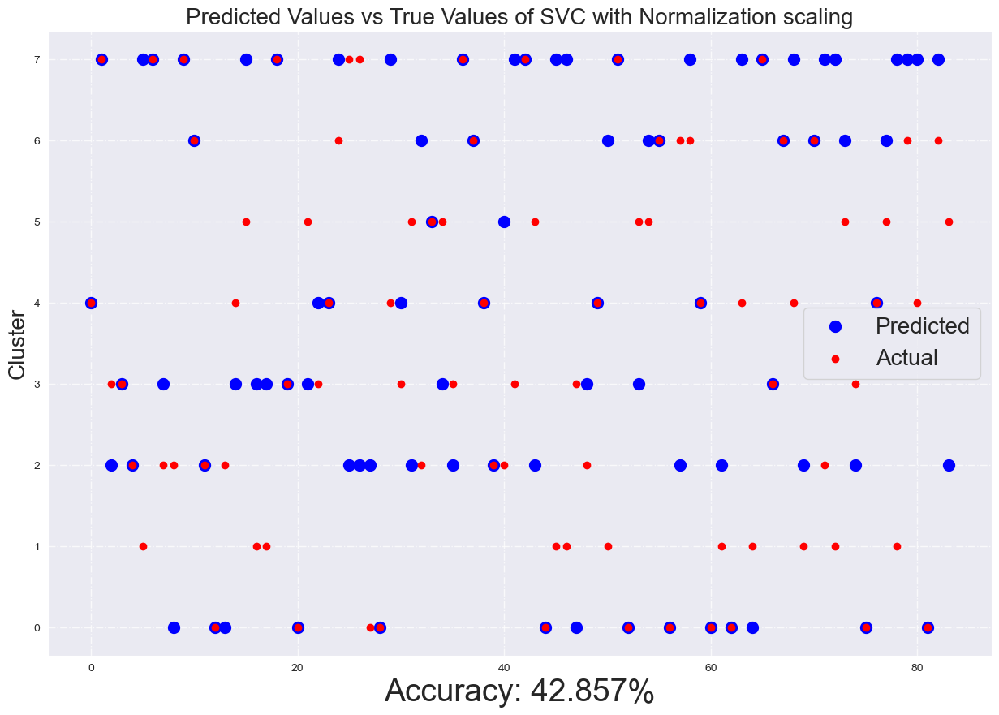

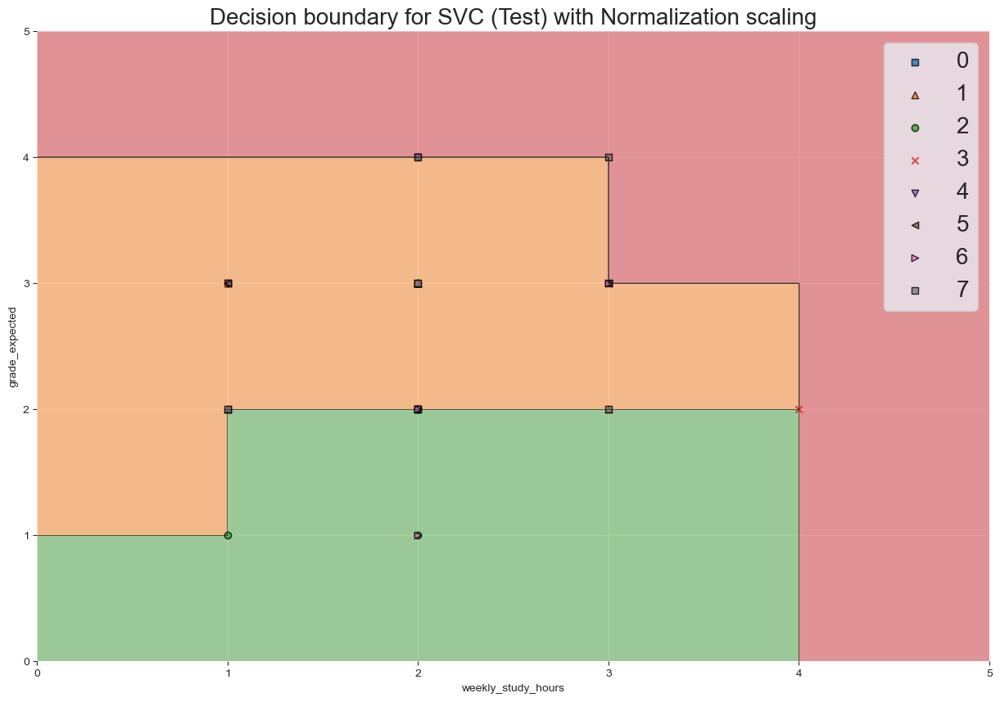

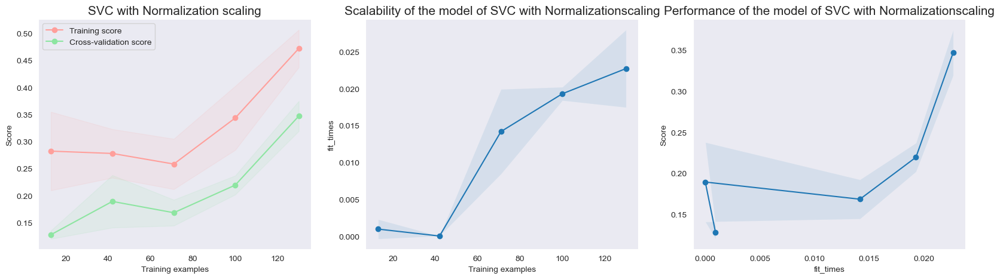

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}]      age  sex  graduated_h_school_type  scholarship_type  additional_work  \
88     1    2                        2                 4                2   
63     2    2                        2                 4                2   
40     1    2                        1                 3                2   
273    1    2                        2                 3                2   
71     1    1                        3                 4                2   
..   ...  ...                      ...               ...              ...   
62     2    2                        2                 3                2   
193    1    1            

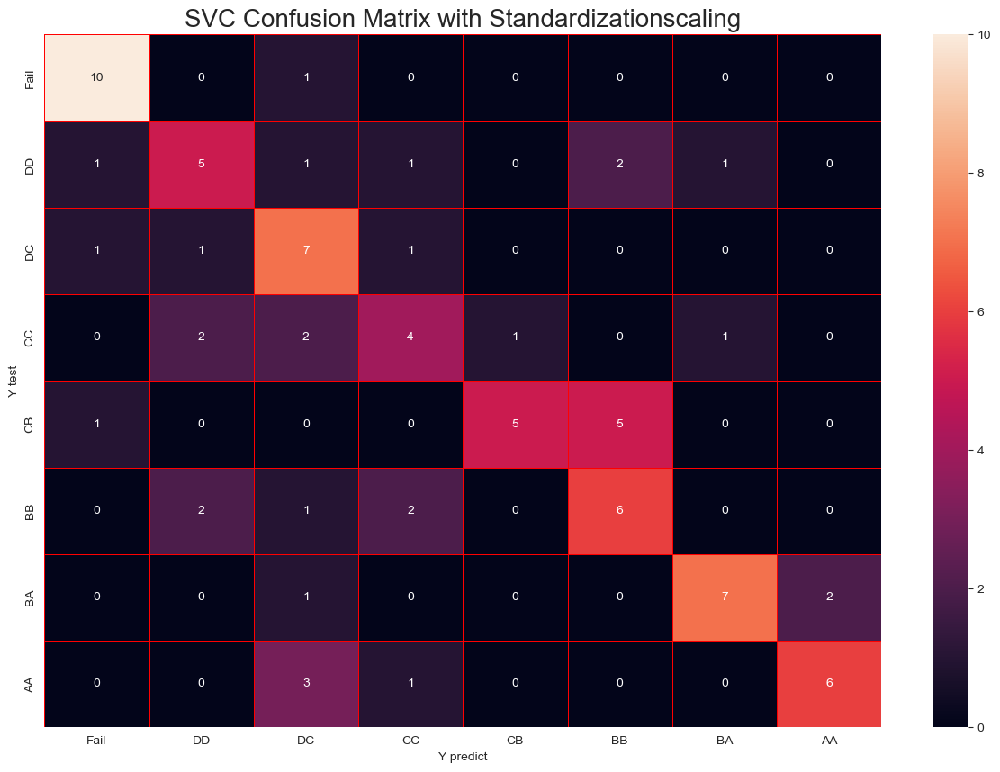

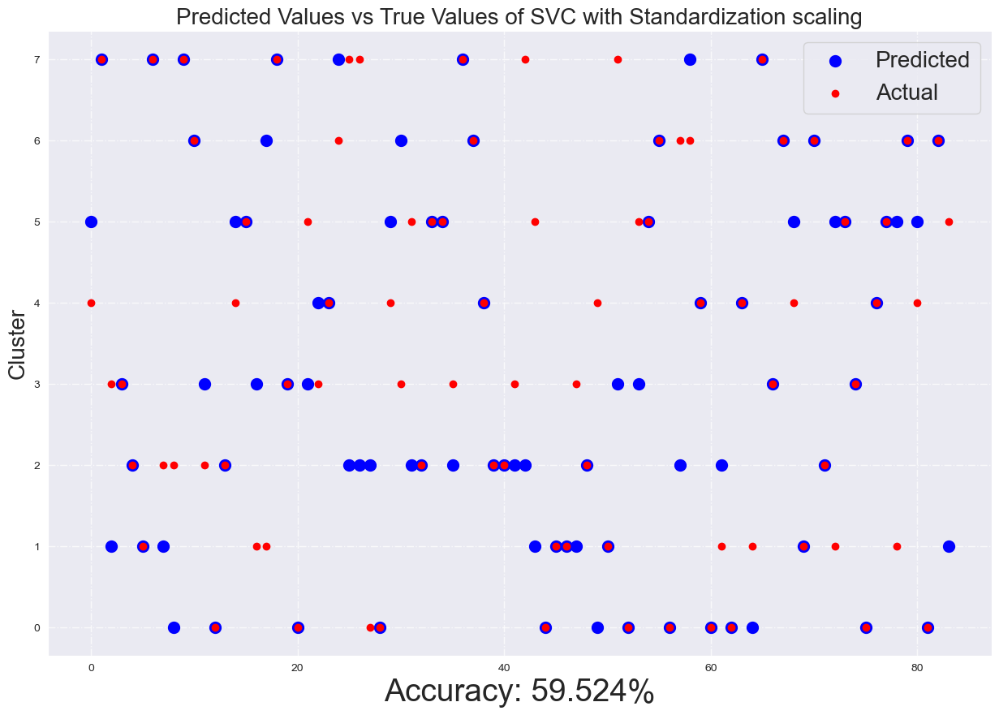

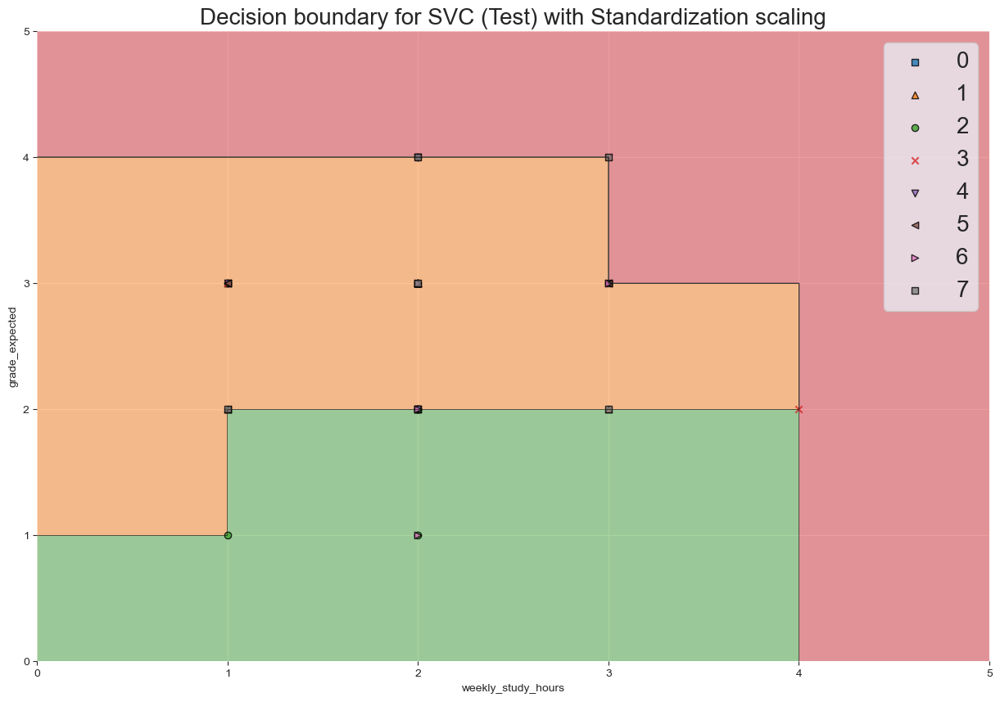

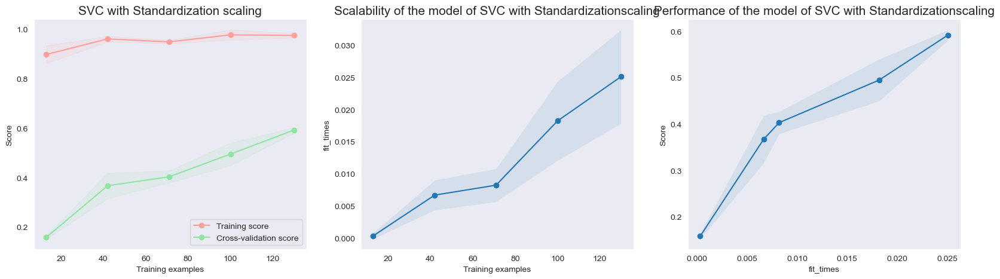

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}, {'Model Name': 'SVC', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.5952380952380952, 'Precision': 0.6226470288970289, 'F1': 0.595304518568561}]      age  sex  graduated_h_school_type  scholarship_type  additional_work  \
88     1    2                        2                 4                2   
63     2    2                        2                 4                2   
40     1    2                        1                 3                2   
273    1    2                        2                 3                2   
71     1    1                        3                 4                2  

In [31]:
#Loads or creates raw, normalized, and standardized train and test sets
import pathlib
import os
from imblearn.over_sampling import SMOTE
if os.path.isfile('X_train_stand.pkl'):

    X_train_raw,X_test_raw,y_train_raw,y_test_raw = load_raw_files()

    X_train_norm,X_test_norm,y_train_norm,y_test_norm= load_norm_files()

    X_train_stand,X_test_stand,y_train_stand,y_test_stand = load_stand_files()

else: 
    
    split_data(X,y)

feature_scaling ={
'Raw':(X_train_raw,X_test_raw,y_train_raw,y_test_raw),
'Normalization':(X_train_norm,X_test_norm,y_train_norm,y_test_norm),
'Standardization':(X_train_stand,X_test_stand,y_train_stand,y_test_stand),
}


KNN=2
Raw
accuracy:  0.6547619047619048
recall:  0.6547619047619048
precision:  0.6905368441082727
f1:  0.6638009986603337
              precision    recall  f1-score   support

           0       0.79      1.00      0.88        11
           1       0.45      0.45      0.45        11
           2       0.55      0.60      0.57        10
           3       0.23      0.30      0.26        10
           4       0.91      0.91      0.91        11
           5       0.60      0.55      0.57        11
           6       1.00      0.70      0.82        10
           7       1.00      0.70      0.82        10

    accuracy                           0.65        84
   macro avg       0.69      0.65      0.66        84
weighted avg       0.69      0.65      0.66        84



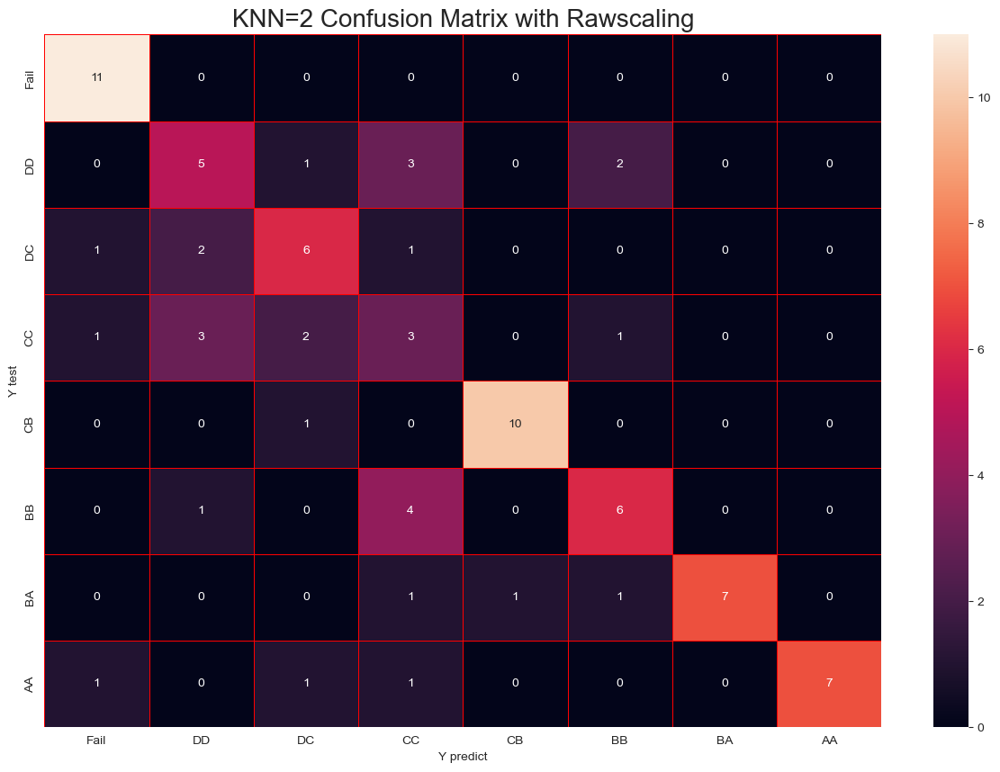

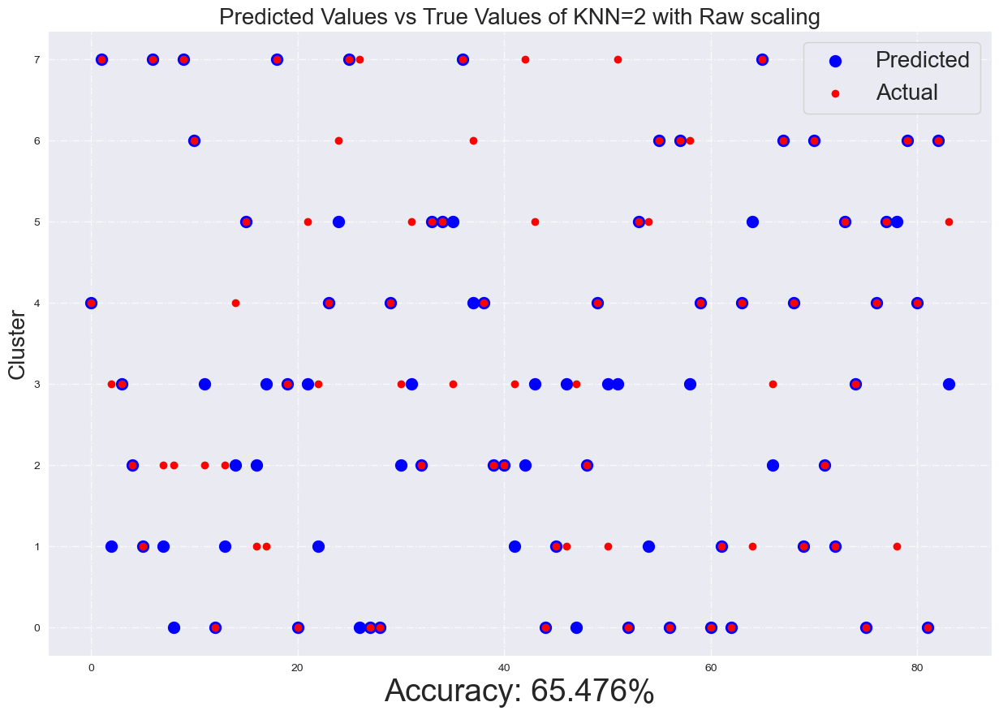

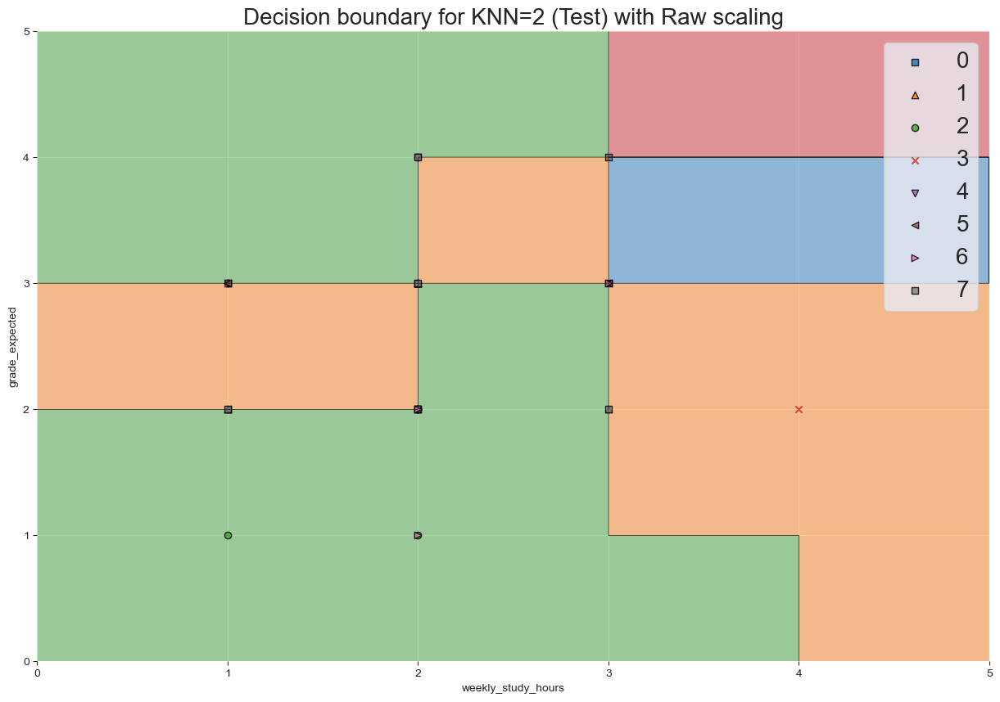

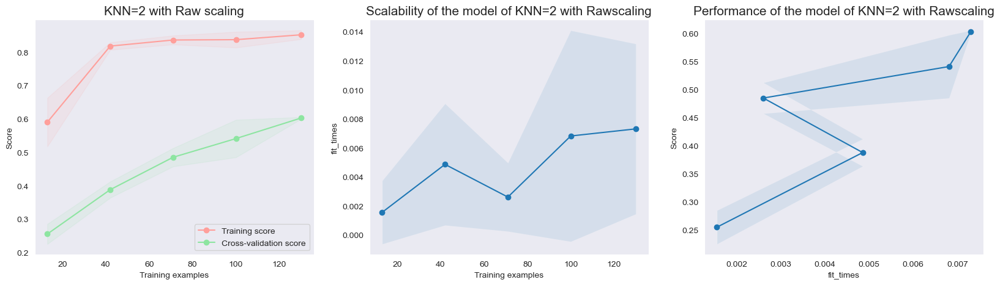

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}, {'Model Name': 'SVC', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.5952380952380952, 'Precision': 0.6226470288970289, 'F1': 0.595304518568561}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Raw', 'Accuracy': 0.6547619047619048, 'Recall': 0.6547619047619048, 'Precision': 0.6905368441082727, 'F1': 0.6638009986603337}]      age  sex  graduated_h_school_type  scholarship_type  additional_work  \
88     1    2                        2                 4                2   
63     2    2                        2                 4                2   
40     1    2                        1                 3 

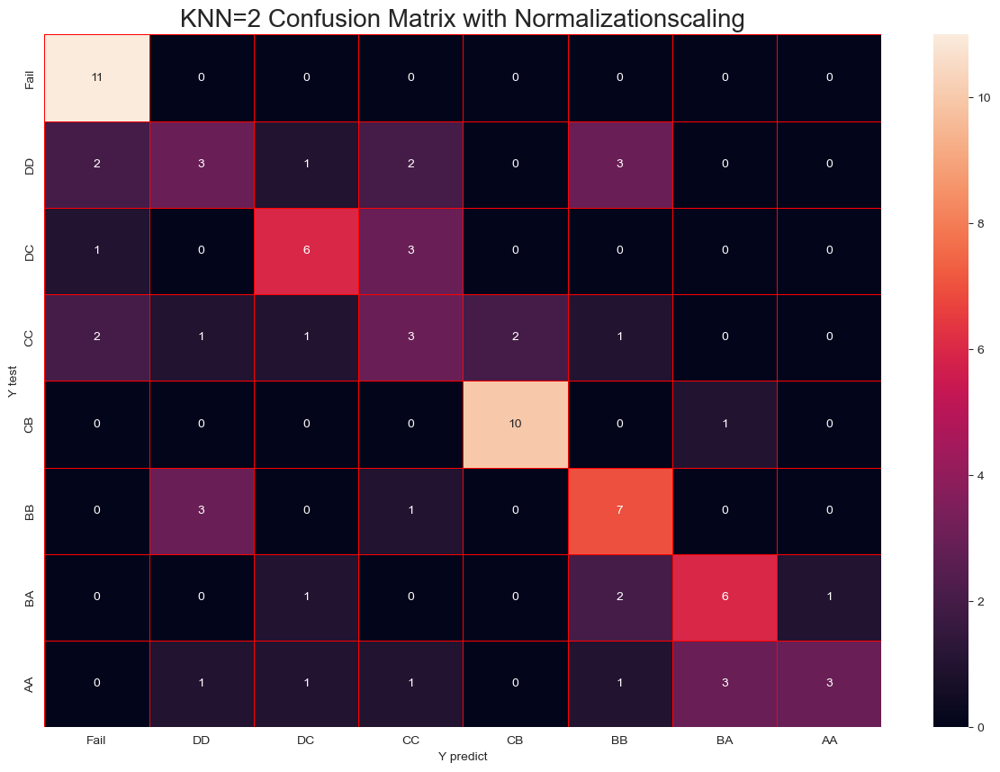

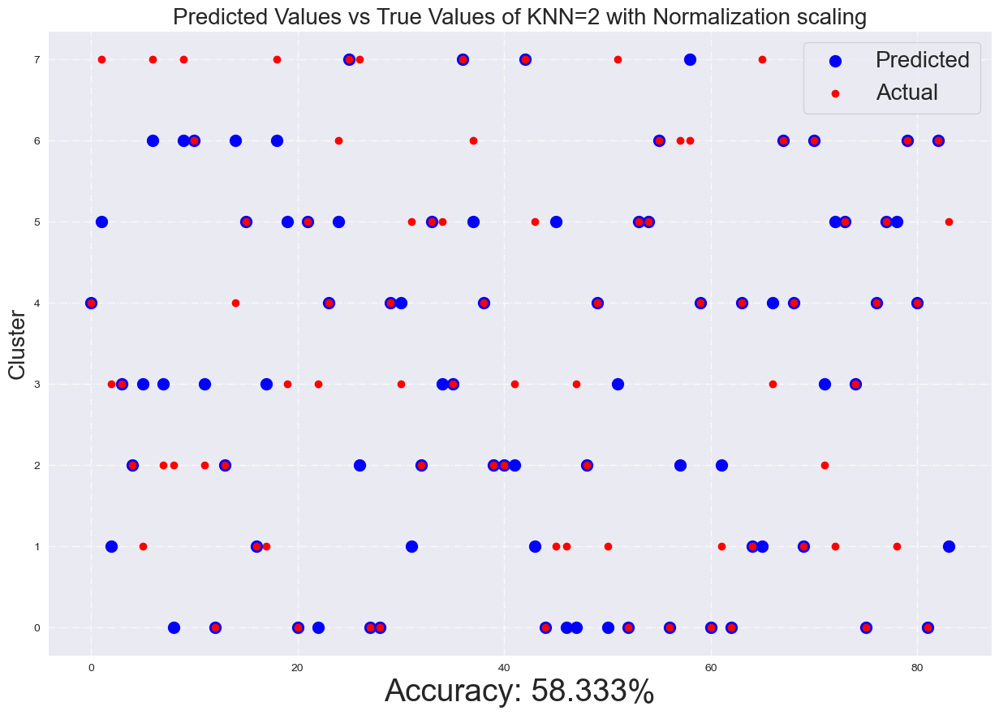

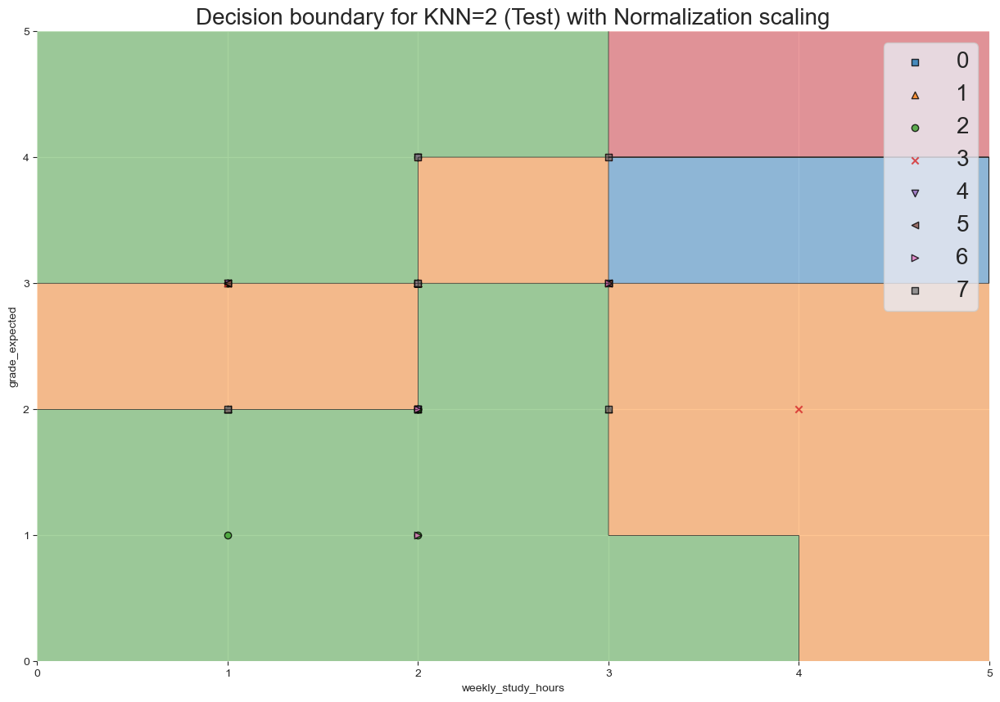

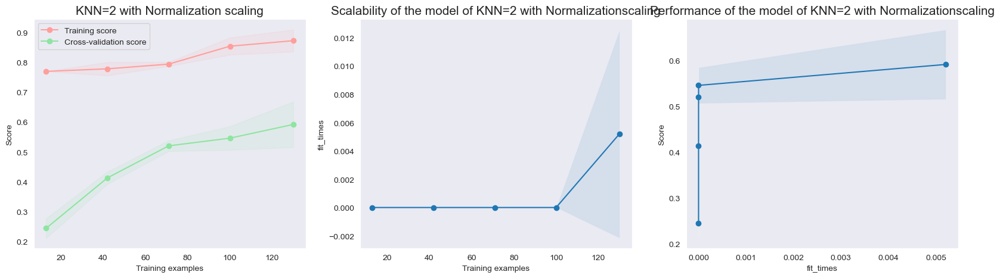

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}, {'Model Name': 'SVC', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.5952380952380952, 'Precision': 0.6226470288970289, 'F1': 0.595304518568561}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Raw', 'Accuracy': 0.6547619047619048, 'Recall': 0.6547619047619048, 'Precision': 0.6905368441082727, 'F1': 0.6638009986603337}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Normalization', 'Accuracy': 0.5833333333333334, 'Recall': 0.5833333333333334, 'Precision': 0.5815972222222223, 'F1': 0.5648521291727132}]      age  sex  graduated_h_school_type  scholarship_type  additional_work  \
88     1    2                

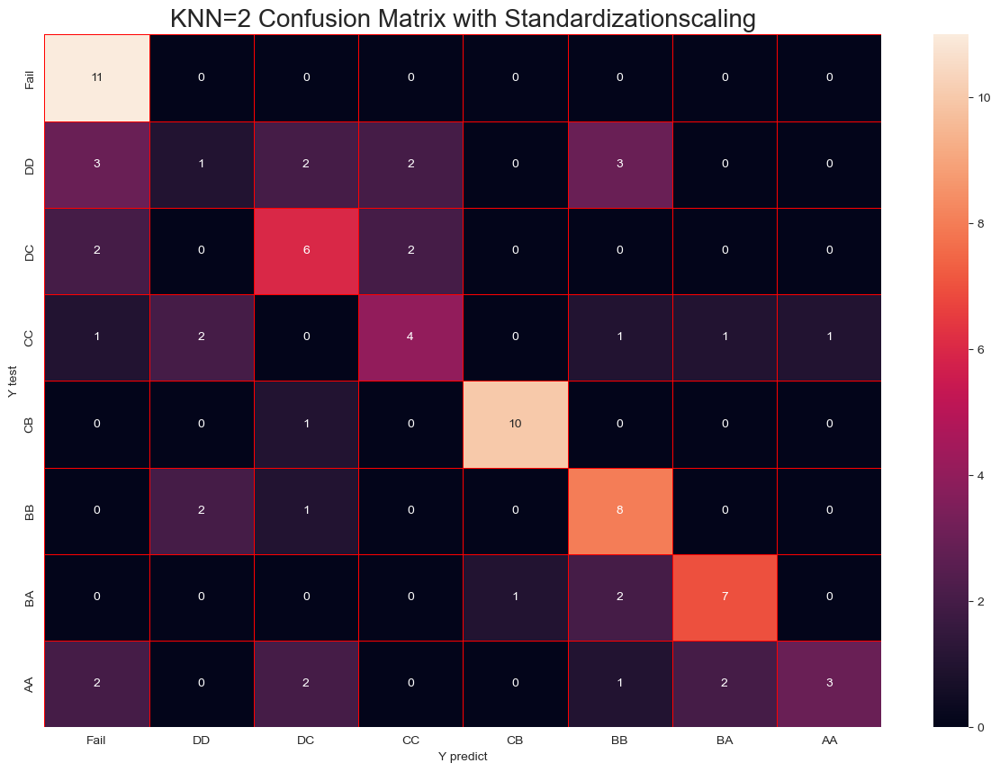

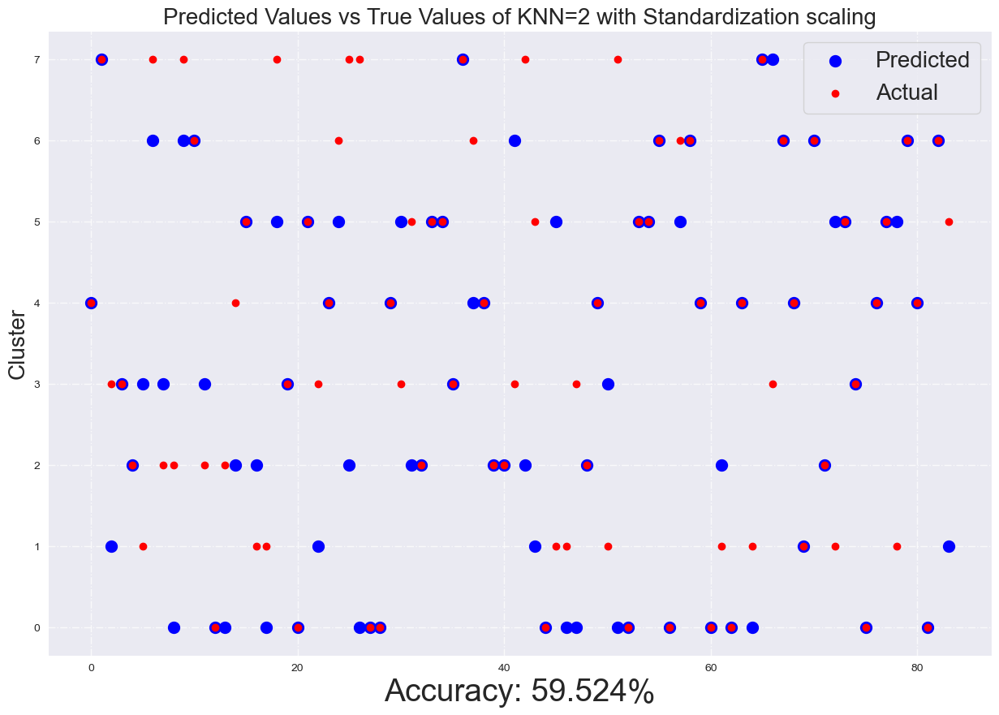

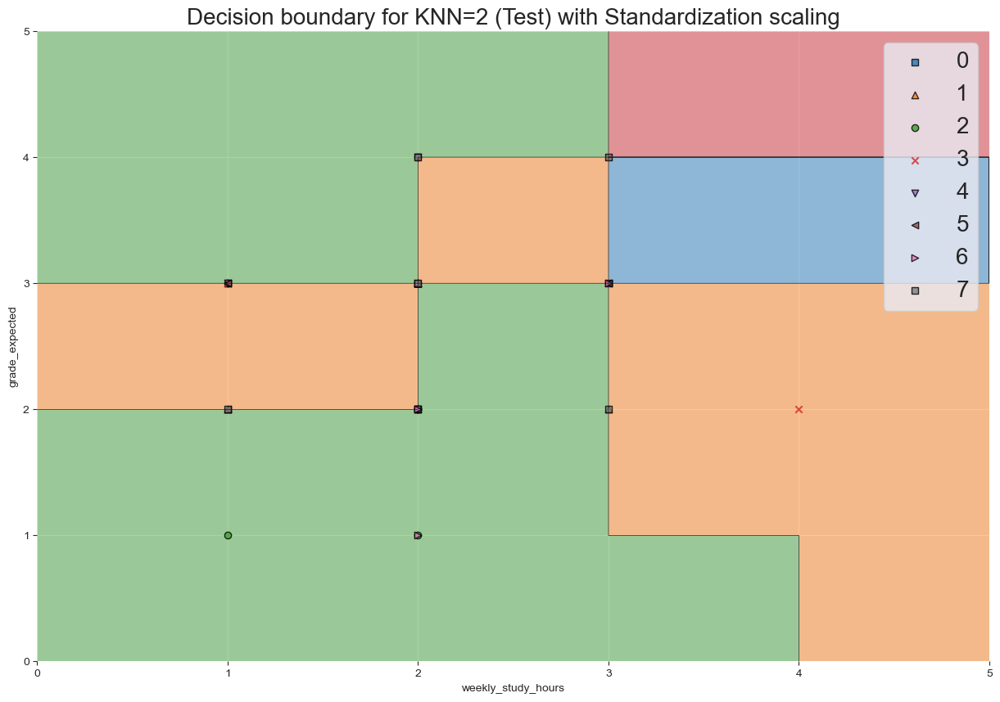

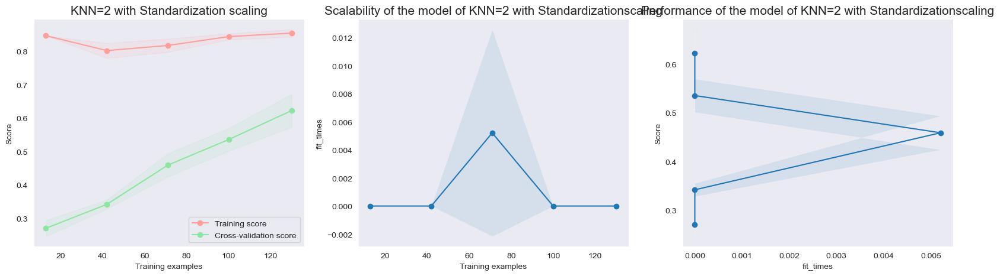

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}, {'Model Name': 'SVC', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.5952380952380952, 'Precision': 0.6226470288970289, 'F1': 0.595304518568561}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Raw', 'Accuracy': 0.6547619047619048, 'Recall': 0.6547619047619048, 'Precision': 0.6905368441082727, 'F1': 0.6638009986603337}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Normalization', 'Accuracy': 0.5833333333333334, 'Recall': 0.5833333333333334, 'Precision': 0.5815972222222223, 'F1': 0.5648521291727132}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.

In [23]:

for fc_name, value in feature_scaling.items():
    scores_l = []
    X_train, X_test, y_train, y_test = value
    for i in range(2,100):
        knn = KNeighborsClassifier(n_neighbors = i)
        knn.fit(X_train, y_train)
        scores_l.append(accuracy_score(y_test,knn.predict(X_test)))
    max_val = max(scores_l)
    max_index = np.argmax(scores_l) + 2
    knn = KNeighborsClassifier(n_neighbors = max_index)
    knn.fit(X_train, y_train)
    run_model(f'KNN={max_index}',knn, X_train, X_test, y_train, y_test,fc_name, proba=True)
    #run_model(f'KNN=fmax_indexr, knn, X_train, X_test, y_train, y_test,fc_name, proba=True) 



DT
Raw
accuracy:  0.47619047619047616
recall:  0.47619047619047616
precision:  0.5521558111548712
f1:  0.44636841670048755
              precision    recall  f1-score   support

           0       0.69      1.00      0.81        11
           1       0.33      0.36      0.35        11
           2       0.62      0.50      0.56        10
           3       0.22      0.20      0.21        10
           4       0.80      0.36      0.50        11
           5       0.29      0.36      0.32        11
           6       0.47      0.90      0.62        10
           7       1.00      0.10      0.18        10

    accuracy                           0.48        84
   macro avg       0.55      0.47      0.44        84
weighted avg       0.55      0.48      0.45        84



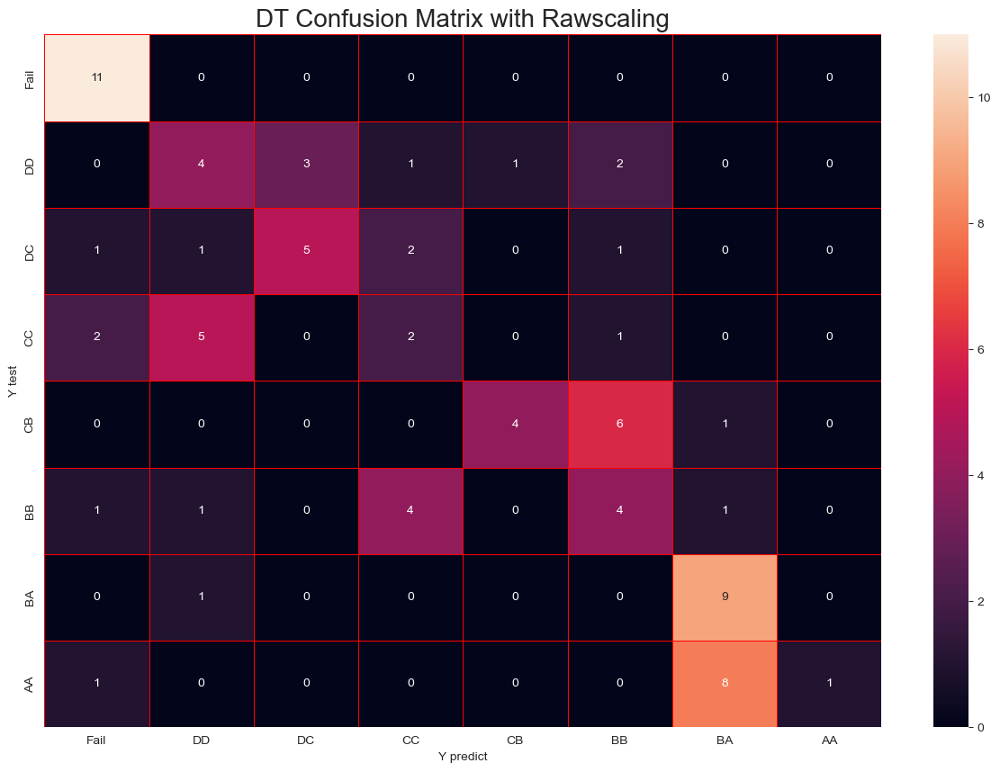

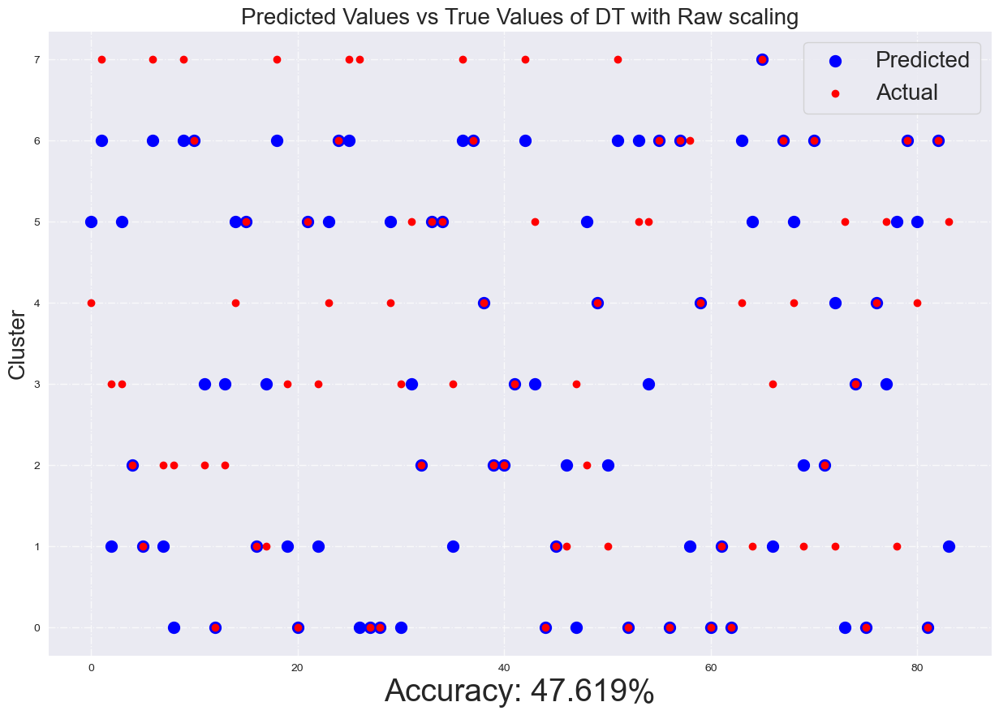

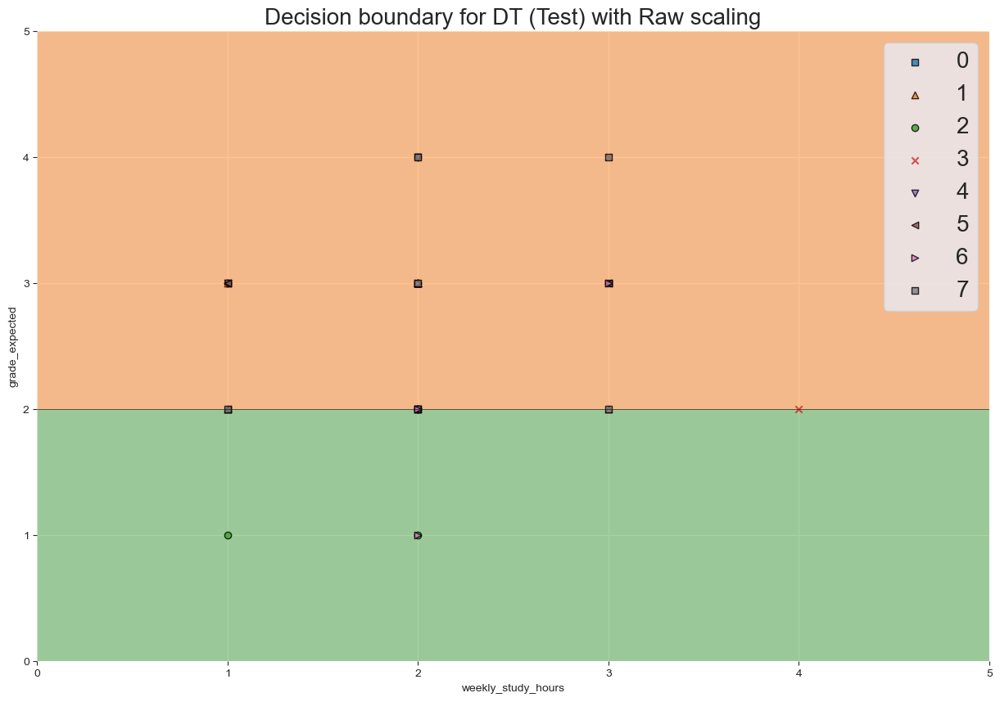

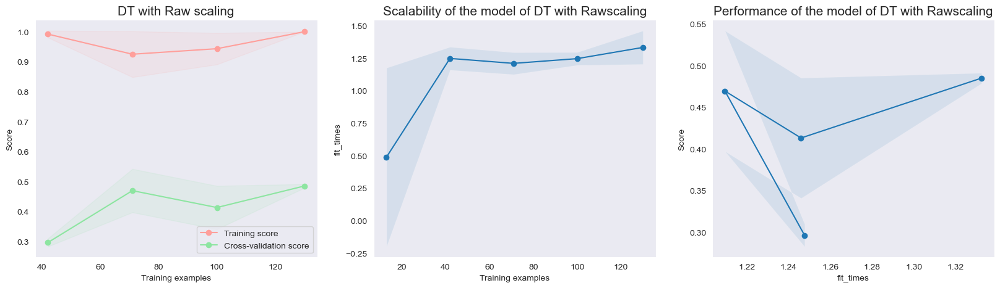

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}, {'Model Name': 'SVC', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.5952380952380952, 'Precision': 0.6226470288970289, 'F1': 0.595304518568561}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Raw', 'Accuracy': 0.6547619047619048, 'Recall': 0.6547619047619048, 'Precision': 0.6905368441082727, 'F1': 0.6638009986603337}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Normalization', 'Accuracy': 0.5833333333333334, 'Recall': 0.5833333333333334, 'Precision': 0.5815972222222223, 'F1': 0.5648521291727132}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.

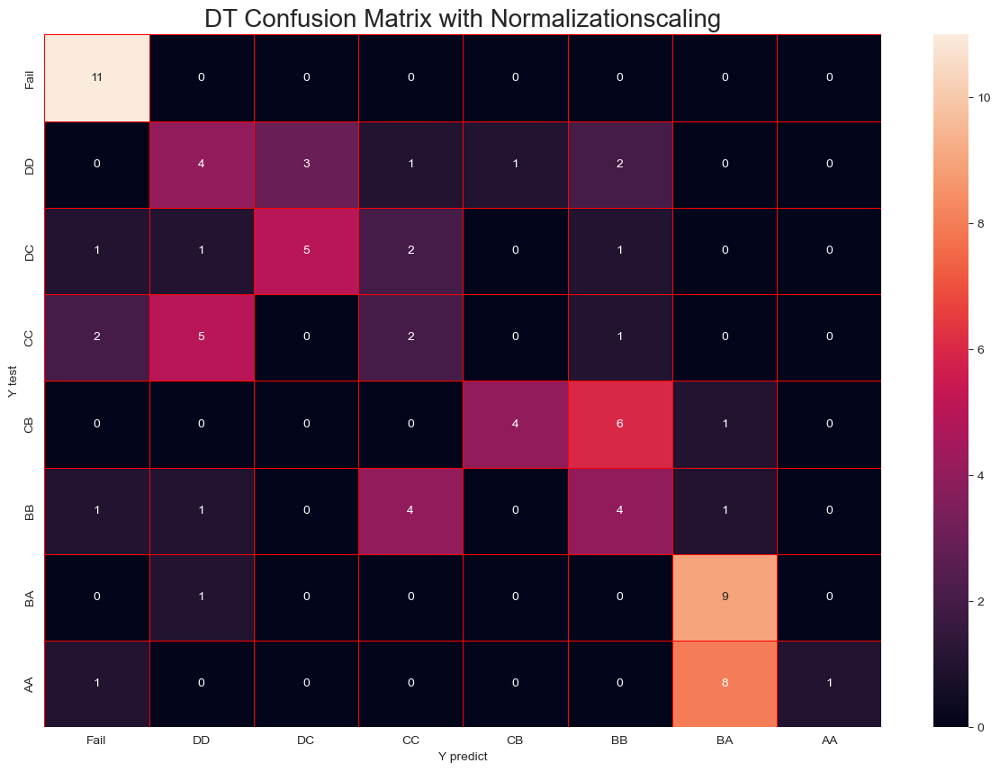

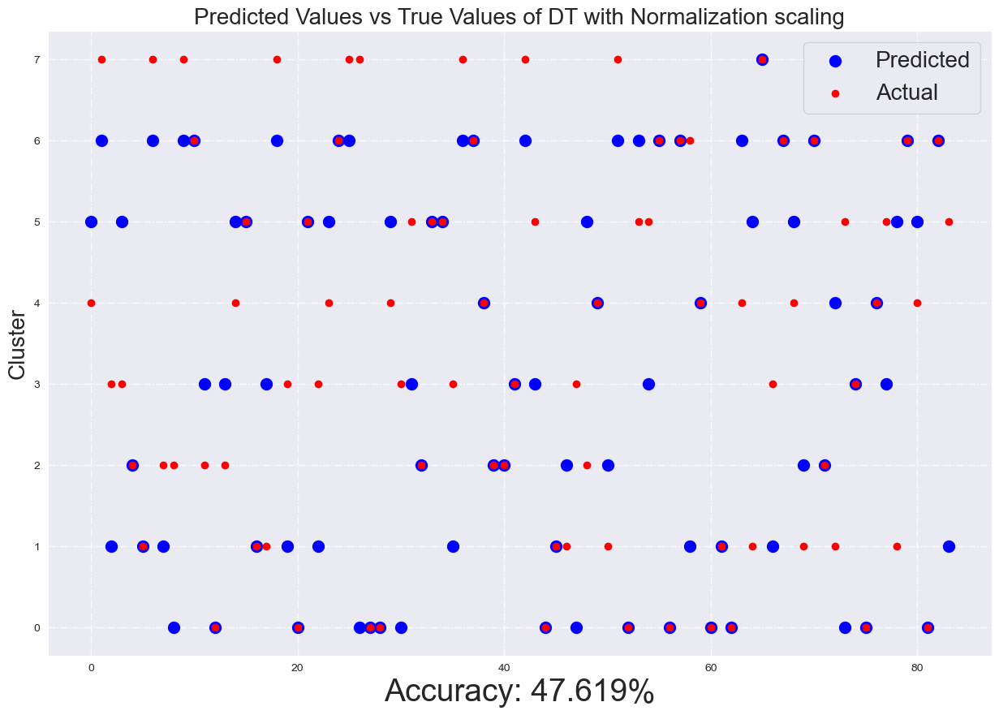

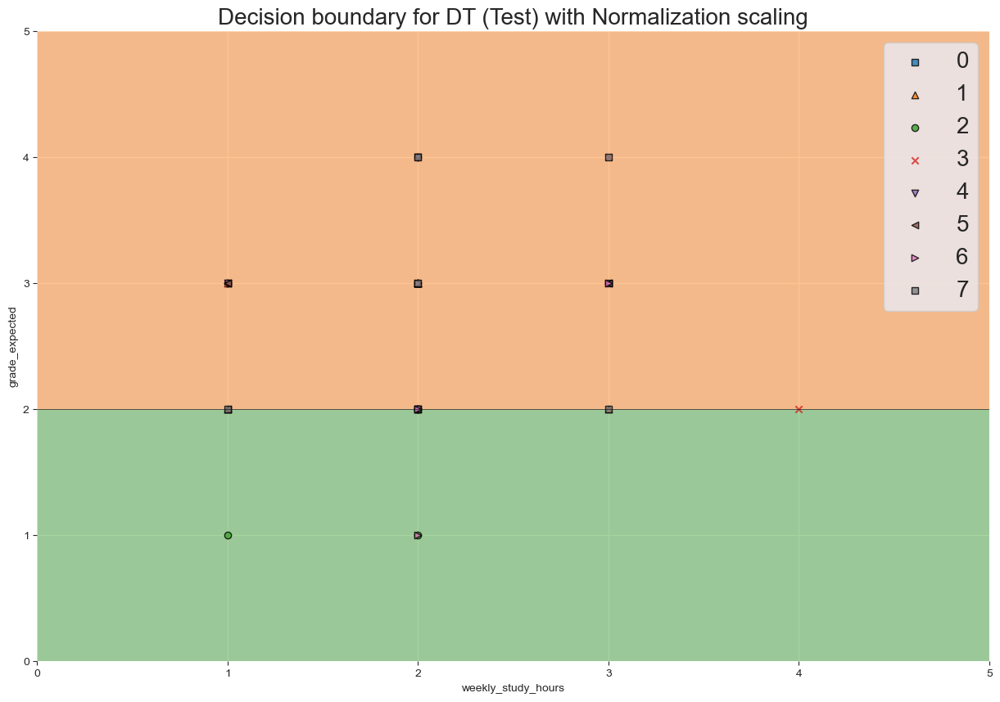

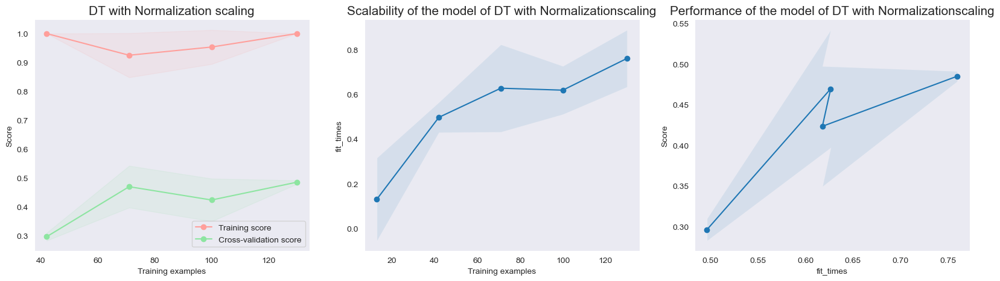

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}, {'Model Name': 'SVC', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.5952380952380952, 'Precision': 0.6226470288970289, 'F1': 0.595304518568561}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Raw', 'Accuracy': 0.6547619047619048, 'Recall': 0.6547619047619048, 'Precision': 0.6905368441082727, 'F1': 0.6638009986603337}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Normalization', 'Accuracy': 0.5833333333333334, 'Recall': 0.5833333333333334, 'Precision': 0.5815972222222223, 'F1': 0.5648521291727132}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.

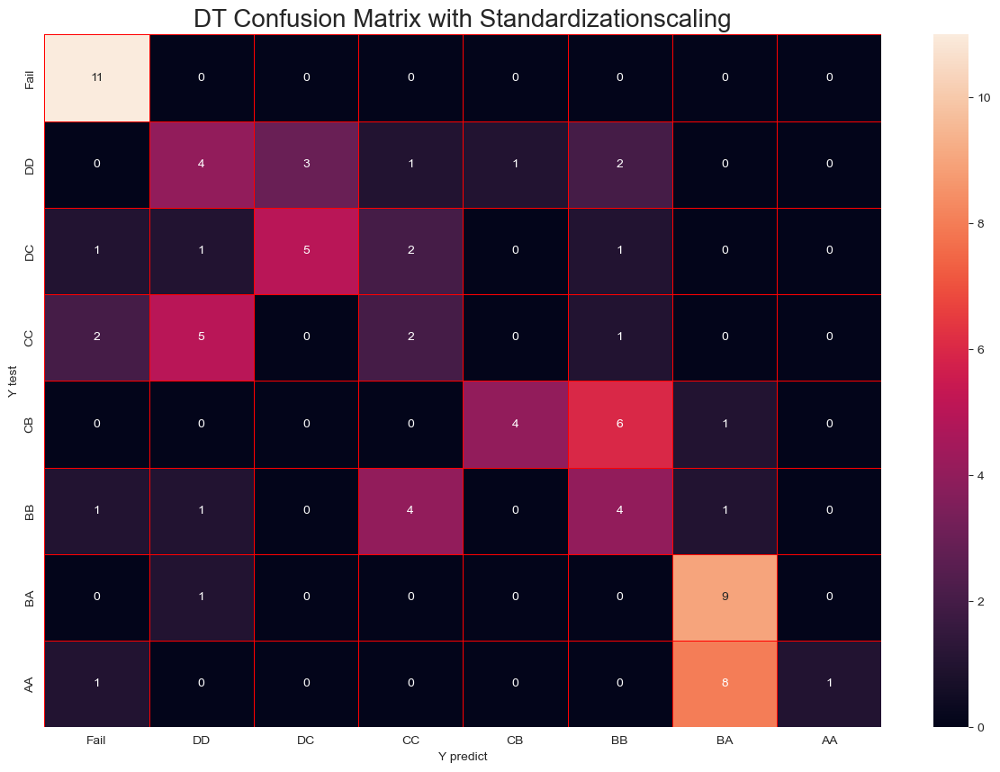

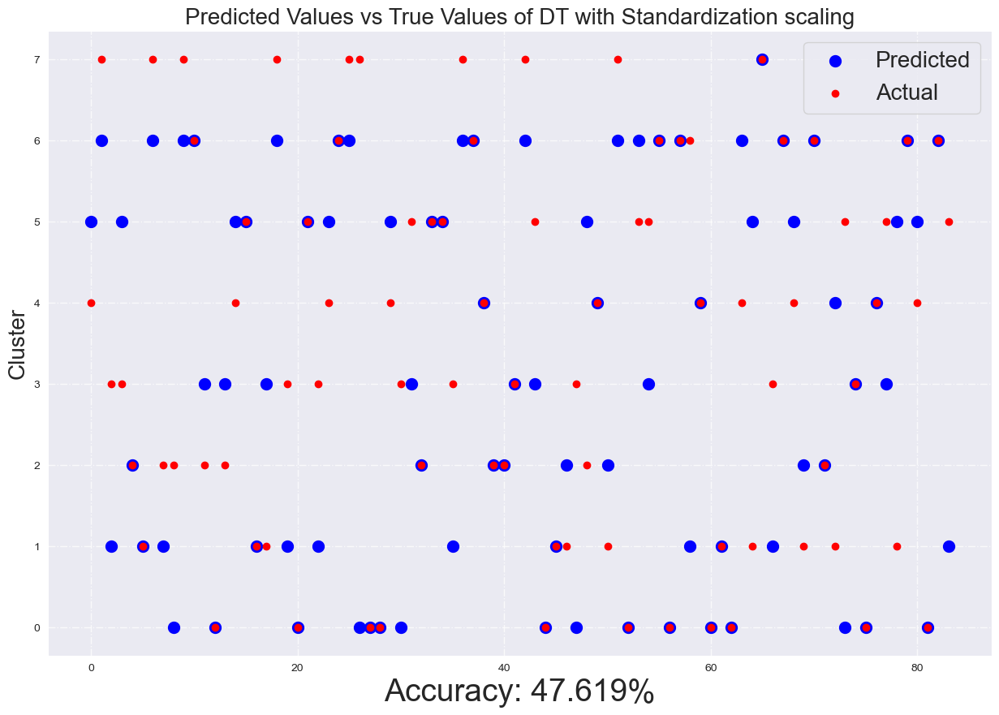

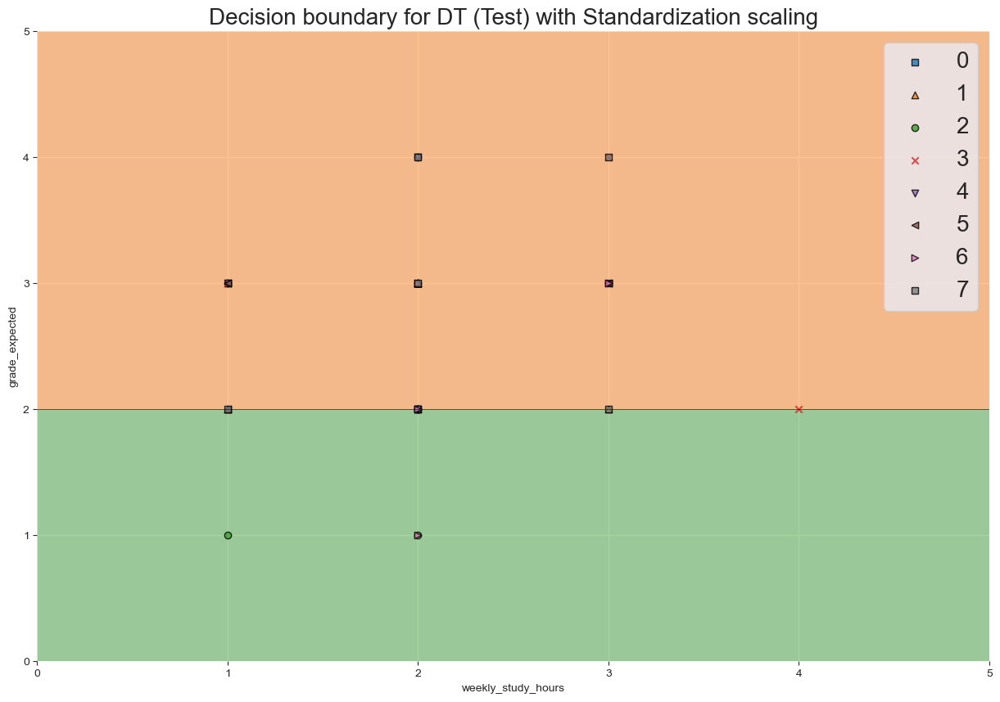

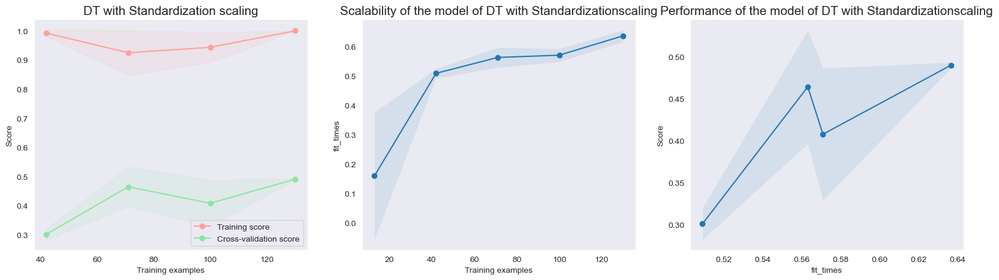

uuu [{'Model Name': 'SVC', 'Feature Scaling': 'Raw', 'Accuracy': 0.7023809523809523, 'Recall': 0.7023809523809523, 'Precision': 0.7293628990057561, 'F1': 0.6987716601560995}, {'Model Name': 'SVC', 'Feature Scaling': 'Normalization', 'Accuracy': 0.42857142857142855, 'Recall': 0.42857142857142855, 'Precision': 0.41271129663986805, 'F1': 0.38574644432671856}, {'Model Name': 'SVC', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.5952380952380952, 'Precision': 0.6226470288970289, 'F1': 0.595304518568561}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Raw', 'Accuracy': 0.6547619047619048, 'Recall': 0.6547619047619048, 'Precision': 0.6905368441082727, 'F1': 0.6638009986603337}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Normalization', 'Accuracy': 0.5833333333333334, 'Recall': 0.5833333333333334, 'Precision': 0.5815972222222223, 'F1': 0.5648521291727132}, {'Model Name': 'KNN=2', 'Feature Scaling': 'Standardization', 'Accuracy': 0.5952380952380952, 'Recall': 0.

In [27]:


for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value

    dt = DecisionTreeClassifier()

    parameters = { 'max_depth':np.arange(1,51, 1),'random_state': [2021]}

    searcher = GridSearchCV (dt, parameters)

    run_model('DT', searcher, X_train,X_test, y_train, y_test, fc_name, proba=True)